In [ ]:

import torch
import torch.nn as nn
from transformers import AutoModel, AutoTokenizer
import shap
import numpy as np
import pandas as pd

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
import torch
import torch.nn as nn
from transformers import AutoModel, AutoTokenizer
import shap
import numpy as np
import pandas as pd

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

class InLegalBERTClassifier(nn.Module):
    def __init__(self, n_classes):
        super(InLegalBERTClassifier, self).__init__()
        self.bert = AutoModel.from_pretrained("law-ai/InLegalBERT")
        self.drop = nn.Dropout(p=0.3)
        self.out = nn.Linear(self.bert.config.hidden_size, n_classes)

    def forward(self, input_ids=None, attention_mask=None, inputs_embeds=None, token_type_ids=None): # Accept token_type_ids
        output = self.bert(input_ids=input_ids, attention_mask=attention_mask, inputs_embeds=inputs_embeds)
        return self.out(self.drop(output.pooler_output))

tokenizer = AutoTokenizer.from_pretrained("law-ai/InLegalBERT")
model = InLegalBERTClassifier(n_classes=2)
model.load_state_dict(torch.load("/content/drive/MyDrive/Colab Notebooks/best_model_state.bin", map_location=device))
model.eval().to(device)

/usr/local/lib/python3.11/dist-packages/huggingface_hub/utils/_auth.py:94: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


tokenizer_config.json:   0%|          | 0.00/516 [00:00<?, ?B/s]

vocab.txt: 0.00B [00:00, ?B/s]

special_tokens_map.json:   0%|          | 0.00/112 [00:00<?, ?B/s]

config.json:   0%|          | 0.00/671 [00:00<?, ?B/s]

pytorch_model.bin:   0%|          | 0.00/534M [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/534M [00:00<?, ?B/s]

InLegalBERTClassifier(
  (bert): BertModel(
    (embeddings): BertEmbeddings(
      (word_embeddings): Embedding(30522, 768, padding_idx=0)
      (position_embeddings): Embedding(512, 768)
      (token_type_embeddings): Embedding(2, 768)
      (LayerNorm): LayerNorm((768,), eps=1e-12, elementwise_affine=True)
      (dropout): Dropout(p=0.1, inplace=False)
    )
    (encoder): BertEncoder(
      (layer): ModuleList(
        (0-11): 12 x BertLayer(
          (attention): BertAttention(
            (self): BertSdpaSelfAttention(
              (query): Linear(in_features=768, out_features=768, bias=True)
              (key): Linear(in_features=768, out_features=768, bias=True)
              (value): Linear(in_features=768, out_features=768, bias=True)
              (dropout): Dropout(p=0.1, inplace=False)
            )
            (output): BertSelfOutput(
              (dense): Linear(in_features=768, out_features=768, bias=True)
              (LayerNorm): LayerNorm((768,), eps=1e-12, ele

In [ ]:

def predict_fn(texts):
    if isinstance(texts, np.ndarray): texts = texts.tolist()
    inputs = tokenizer(texts, return_tensors="pt", padding=True, truncation=True, max_length=512)
    inputs = {k: v.to(device) for k, v in inputs.items()}
    with torch.no_grad():
        logits = model(**inputs)
        probs = torch.nn.functional.softmax(logits, dim=1)
    return probs.cpu().numpy()


In [ ]:
# ================= ENHANCED TEXT TRANSFORMATION ATTACKS WITH VISUALIZATIONS =================

import ipywidgets as widgets
from IPython.display import display, clear_output
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import shap
import random
import re
from collections import defaultdict
import seaborn as sns
from scipy.stats import kendalltau, spearmanr, pearsonr
from sklearn.metrics.pairwise import cosine_similarity
import nltk
from nltk.corpus import wordnet
import string
from tqdm import tqdm

# Set style for better plots
plt.style.use('seaborn-v0_8')
sns.set_palette("husl")

# Download required NLTK data
try:
    nltk.download('wordnet', quiet=True)
    nltk.download('punkt', quiet=True)
    nltk.download('averaged_perceptron_tagger', quiet=True)
    print("NLTK data downloaded successfully")
except:
    print("NLTK download failed - some synonym attacks may not work")

# ================= TEXT TRANSFORMATION ATTACK FUNCTIONS =================

class TextTransformationAttacks:
    """
    Collection of text transformation attacks for adversarial testing
    """

    def __init__(self, tokenizer=None):
        self.tokenizer = tokenizer

        # Common legal synonyms for domain-specific attacks
        self.legal_synonyms = {
            'granted': ['allowed', 'approved', 'permitted', 'accepted', 'authorized'],
            'dismissed': ['rejected', 'denied', 'refused', 'declined', 'repudiated'],
            'petition': ['application', 'request', 'appeal', 'motion', 'filing'],
            'court': ['tribunal', 'judge', 'judicial body', 'bench', 'judiciary'],
            'evidence': ['proof', 'testimony', 'documentation', 'facts', 'materials'],
            'defendant': ['accused', 'respondent', 'party', 'individual'],
            'plaintiff': ['petitioner', 'complainant', 'applicant', 'claimant'],
            'judgment': ['decision', 'ruling', 'verdict', 'determination'],
            'counsel': ['attorney', 'lawyer', 'advocate', 'representative'],
            'hearing': ['proceeding', 'session', 'trial', 'examination'],
            'motion': ['request', 'application', 'petition', 'proposal'],
            'order': ['directive', 'command', 'ruling', 'decree'],
            'appeal': ['challenge', 'review', 'reconsideration', 'petition']
        }

        # Character substitution maps for typo attacks
        self.char_substitutions = {
            'a': ['@', 'á', 'à', 'â'],
            'e': ['3', 'é', 'è', 'ê'],
            'i': ['1', '!', 'í', 'ì'],
            'o': ['0', 'ó', 'ò', 'ô'],
            'u': ['ú', 'ù', 'û'],
            's': ['$', '5'],
            'l': ['1', '|'],
            't': ['7'],
            'g': ['9', 'q']
        }

    def synonym_attack(self, text, num_replacements=3, use_wordnet=True):
        """Apply synonym replacement attack"""
        words = text.split()
        modified_words = words.copy()
        replacements_made = 0

        # Try legal synonyms first
        for i, word in enumerate(words):
            if replacements_made >= num_replacements:
                break

            word_lower = word.lower().strip('.,!?;:')
            if word_lower in self.legal_synonyms:
                synonym = random.choice(self.legal_synonyms[word_lower])
                # Preserve case
                if word[0].isupper():
                    synonym = synonym.capitalize()
                modified_words[i] = word.replace(word_lower, synonym)
                replacements_made += 1

        # Use WordNet for additional synonyms if needed
        if use_wordnet and replacements_made < num_replacements:
            try:
                for i, word in enumerate(words):
                    if replacements_made >= num_replacements:
                        break

                    word_clean = word.lower().strip('.,!?;:')
                    if len(word_clean) > 3:  # Only replace longer words
                        synonyms = []
                        for syn in wordnet.synsets(word_clean):
                            for lemma in syn.lemmas():
                                if lemma.name() != word_clean and '_' not in lemma.name():
                                    synonyms.append(lemma.name())

                        if synonyms:
                            synonym = random.choice(synonyms)
                            if word[0].isupper():
                                synonym = synonym.capitalize()
                            modified_words[i] = word.replace(word_clean, synonym)
                            replacements_made += 1
            except:
                pass

        return ' '.join(modified_words)

    def typo_attack(self, text, typo_rate=0.1):
        """Apply character-level typo attacks"""
        chars = list(text)
        num_typos = int(len(chars) * typo_rate)

        for _ in range(num_typos):
            pos = random.randint(0, len(chars) - 1)
            char = chars[pos].lower()

            # Skip spaces and punctuation
            if char in ' .,!?;:':
                continue

            # Apply different typo types
            typo_type = random.choice(['substitute', 'insert', 'delete', 'swap'])

            if typo_type == 'substitute' and char in self.char_substitutions:
                chars[pos] = random.choice(self.char_substitutions[char])
            elif typo_type == 'insert' and pos < len(chars) - 1:
                chars.insert(pos, random.choice('abcdefghijklmnopqrstuvwxyz'))
            elif typo_type == 'delete' and len(chars) > 10:
                chars.pop(pos)
            elif typo_type == 'swap' and pos < len(chars) - 1:
                chars[pos], chars[pos + 1] = chars[pos + 1], chars[pos]

        return ''.join(chars)

    def paraphrase_attack(self, text, num_patterns=3):
        """Apply rule-based paraphrasing"""
        paraphrase_patterns = [
            (r'\bThe court finds\b', 'It is determined by the court'),
            (r'\bis granted\b', 'shall be allowed'),
            (r'\bis dismissed\b', 'shall be rejected'),
            (r'\bpetition\b', 'formal request'),
            (r'\bafter consideration\b', 'following review'),
            (r'\bIt is ordered\b', 'The court orders'),
            (r'\bplaintiff\b', 'the party bringing suit'),
            (r'\bdefendant\b', 'the responding party'),
            (r'\bin accordance with\b', 'pursuant to'),
            (r'\btherefore\b', 'consequently'),
            (r'\bfurthermore\b', 'additionally'),
            (r'\bhowever\b', 'nevertheless'),
            (r'\bnotwithstanding\b', 'despite')
        ]

        modified_text = text
        patterns_applied = 0

        for pattern, replacement in paraphrase_patterns:
            if patterns_applied >= num_patterns:
                break
            if re.search(pattern, modified_text, re.IGNORECASE):
                modified_text = re.sub(pattern, replacement, modified_text, flags=re.IGNORECASE)
                patterns_applied += 1

        return modified_text

    def word_reordering_attack(self, text, num_swaps=2):
        """Apply word reordering attack"""
        words = text.split()
        if len(words) < 4:
            return text

        modified_words = words.copy()

        for _ in range(num_swaps):
            # Don't swap first and last words to preserve meaning
            i = random.randint(1, len(words) - 3)
            j = random.randint(i + 1, len(words) - 2)
            modified_words[i], modified_words[j] = modified_words[j], modified_words[i]

        return ' '.join(modified_words)

    def case_attack(self, text):
        """Apply random case changes"""
        chars = list(text)
        for i in range(len(chars)):
            if chars[i].isalpha() and random.random() < 0.2:
                chars[i] = chars[i].swapcase()
        return ''.join(chars)

    def punctuation_attack(self, text):
        """Add/remove/change punctuation"""
        # Remove some punctuation
        text = re.sub(r'[,;:]', '', text, count=random.randint(1, 3))

        # Add extra punctuation
        words = text.split()
        for i in range(random.randint(1, 3)):
            if len(words) > 2:
                pos = random.randint(1, len(words) - 2)
                punct = random.choice([',', ';', ':'])
                words[pos] = words[pos] + punct

        return ' '.join(words)

# ================= UPDATED SHAP ANALYSIS FUNCTIONS =================

def run_text_attack_analysis(text, attack_type='synonym', intensity=0.3, predict_fn=None, tokenizer=None):
    """
    Updated version of the run function for text transformation attacks

    Args:
        text: Input text to analyze
        attack_type: Type of attack ('synonym', 'typo', 'paraphrase', 'reorder', 'case', 'punctuation')
        intensity: Attack intensity (0.0 to 1.0)
        predict_fn: Prediction function
        tokenizer: Tokenizer for SHAP

    Returns:
        Dictionary with analysis results
    """
    if predict_fn is None:
        raise ValueError("predict_fn must be provided")

    attacks_obj = TextTransformationAttacks(tokenizer)

    # Get SHAP values for clean and attacked text
    shap_clean, shap_attacked, clean_text, attacked_text = shap_with_text_attacks(
        text, attack_type, intensity, attacks_obj, predict_fn, tokenizer
    )

    print(f"\n=== {attack_type.upper()} ATTACK ANALYSIS (Intensity: {intensity}) ===")
    print(f"\nOriginal Text:\n{clean_text}")
    print(f"\nAttacked Text:\n{attacked_text}")

    # Get predictions
    clean_pred = predict_fn([clean_text])
    attacked_pred = predict_fn([attacked_text])

    print(f"\nOriginal Prediction: {clean_pred}")
    print(f"Attacked Prediction: {attacked_pred}")

    # Check if attack was successful (prediction flipped)
    clean_class = np.argmax(clean_pred)
    attacked_class = np.argmax(attacked_pred)
    attack_success = clean_class != attacked_class

    print(f"\nPrediction Flip: {'YES' if attack_success else 'NO'}")
    print(f"Confidence Change: {np.max(clean_pred):.3f} → {np.max(attacked_pred):.3f}")

    return {
        'clean_text': clean_text,
        'attacked_text': attacked_text,
        'clean_pred': clean_pred,
        'attacked_pred': attacked_pred,
        'shap_clean': shap_clean,
        'shap_attacked': shap_attacked,
        'attack_success': attack_success,
        'attack_type': attack_type,
        'intensity': intensity
    }

def shap_with_text_attacks(text, attack_type='synonym', attack_intensity=0.3, attacks_obj=None, predict_fn=None, tokenizer=None):
    """
    Compare SHAP values before and after text transformation attacks
    """
    if attacks_obj is None:
        attacks_obj = TextTransformationAttacks(tokenizer)

    if predict_fn is None:
        raise ValueError("predict_fn must be provided")

    # Clean SHAP values
    explainer_clean = shap.Explainer(predict_fn, shap.maskers.Text(tokenizer))
    shap_values_clean = explainer_clean([text])

    # Apply text transformation attack
    if attack_type == 'synonym':
        num_replacements = max(1, int(len(text.split()) * attack_intensity))
        attacked_text = attacks_obj.synonym_attack(text, num_replacements)
    elif attack_type == 'typo':
        attacked_text = attacks_obj.typo_attack(text, attack_intensity)
    elif attack_type == 'paraphrase':
        num_patterns = max(1, int(5 * attack_intensity))
        attacked_text = attacks_obj.paraphrase_attack(text, num_patterns)
    elif attack_type == 'reorder':
        num_swaps = max(1, int(len(text.split()) * attack_intensity / 2))
        attacked_text = attacks_obj.word_reordering_attack(text, num_swaps)
    elif attack_type == 'case':
        attacked_text = attacks_obj.case_attack(text)
    elif attack_type == 'punctuation':
        attacked_text = attacks_obj.punctuation_attack(text)
    else:
        raise ValueError(f"Unknown attack type: {attack_type}")

    # Attacked SHAP values
    explainer_attacked = shap.Explainer(predict_fn, shap.maskers.Text(tokenizer))
    shap_values_attacked = explainer_attacked([attacked_text])

    return shap_values_clean[0], shap_values_attacked[0], text, attacked_text

def compare_shap_text_attacks(shap_clean, shap_attacked, predict_fn):
    """
    Enhanced SHAP comparison function for text attacks
    """
    def extract_top(shap_vals, text_tokens):
        vals = shap_vals.values
        tokens = text_tokens

        # Get class prediction
        class_idx = np.argmax(predict_fn([" ".join(tokens)]))

        # Extract importance scores for the predicted class
        scores = [abs(v[class_idx]) if len(v.shape) > 0 and v.shape[0] > class_idx else abs(v) for v in vals]

        df = pd.DataFrame(list(zip(tokens, scores)), columns=["Token", "Importance"])
        df = df[df["Token"].str.strip() != ""].drop_duplicates("Token")
        df = df.nlargest(min(20, len(df)), "Importance")
        return df.reset_index(drop=True)

    # Extract top tokens for both clean and attacked versions
    df_clean = extract_top(shap_clean, shap_clean.data)
    df_attacked = extract_top(shap_attacked, shap_attacked.data)

    print("\n=== SHAP VALUE COMPARISON ===")
    print("\nTop Important Tokens (Original):")
    print(df_clean.head(10))
    print("\nTop Important Tokens (Attacked):")
    print(df_attacked.head(10))

    # Calculate SHAP stability metric
    min_len = min(len(shap_clean.values), len(shap_attacked.values))
    if min_len > 0:
        shap_diff = np.mean(np.abs(shap_clean.values[:min_len] - shap_attacked.values[:min_len]))
        print(f"\nSHAP Stability (lower is better): {shap_diff:.4f}")

    return df_clean, df_attacked

# ================= COMPREHENSIVE VISUALIZATION FUNCTIONS =================

def create_attack_comparison_plots(text_list, predict_fn, tokenizer, max_samples=50):
    """
    Create comprehensive plots comparing different attack types
    """
    # Limit samples for computational efficiency
    if len(text_list) > max_samples:
        text_sample = random.sample(text_list, max_samples)
        print(f"Using random sample of {max_samples} texts for analysis")
    else:
        text_sample = text_list

    attacks_obj = TextTransformationAttacks(tokenizer)
    attack_types = ['synonym', 'typo', 'paraphrase', 'reorder']
    intensity_levels = [0.1, 0.2, 0.3, 0.4, 0.5]

    # Data collection
    results = defaultdict(lambda: defaultdict(list))

    print("Running attack analysis...")
    for attack_type in tqdm(attack_types, desc="Attack types"):
        for intensity in tqdm(intensity_levels, desc=f"{attack_type} intensities", leave=False):
            flip_rate = 0
            shap_diffs = []
            conf_changes = []

            for text in text_sample[:min(20, len(text_sample))]:  # Further limit for SHAP computation
                try:
                    # Run attack
                    result = run_text_attack_analysis(
                        text.strip(), attack_type, intensity, predict_fn, tokenizer
                    )

                    # Track metrics
                    if result['attack_success']:
                        flip_rate += 1

                    # SHAP difference
                    min_len = min(len(result['shap_clean'].values),
                                len(result['shap_attacked'].values))
                    if min_len > 0:
                        shap_diff = np.mean(np.abs(
                            result['shap_clean'].values[:min_len] -
                            result['shap_attacked'].values[:min_len]
                        ))
                        shap_diffs.append(shap_diff)

                    # Confidence change
                    conf_change = np.max(result['clean_pred']) - np.max(result['attacked_pred'])
                    conf_changes.append(conf_change)

                except Exception as e:
                    print(f"Error processing text with {attack_type} attack: {e}")
                    continue

            # Store results
            sample_size = min(20, len(text_sample))
            results[attack_type]['flip_rates'].append(flip_rate / sample_size)
            results[attack_type]['shap_differences'].append(np.mean(shap_diffs) if shap_diffs else 0)
            results[attack_type]['confidence_changes'].append(np.mean(conf_changes) if conf_changes else 0)

    # Create visualizations
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    fig.suptitle('Text Transformation Attack Analysis', fontsize=16, fontweight='bold')

    # Plot 1: Prediction Flip Rates
    ax1 = axes[0, 0]
    for attack_type in attack_types:
        ax1.plot(intensity_levels, results[attack_type]['flip_rates'],
                marker='o', linewidth=2, label=attack_type.capitalize())
    ax1.set_xlabel('Attack Intensity')
    ax1.set_ylabel('Prediction Flip Rate')
    ax1.set_title('Prediction Flip Rates by Attack Type')
    ax1.legend()
    ax1.grid(True, alpha=0.3)

    # Plot 2: SHAP Value Differences
    ax2 = axes[0, 1]
    for attack_type in attack_types:
        ax2.plot(intensity_levels, results[attack_type]['shap_differences'],
                marker='s', linewidth=2, label=attack_type.capitalize())
    ax2.set_xlabel('Attack Intensity')
    ax2.set_ylabel('Mean SHAP Difference')
    ax2.set_title('SHAP Value Stability')
    ax2.legend()
    ax2.grid(True, alpha=0.3)

    # Plot 3: Confidence Changes
    ax3 = axes[1, 0]
    for attack_type in attack_types:
        ax3.plot(intensity_levels, results[attack_type]['confidence_changes'],
                marker='^', linewidth=2, label=attack_type.capitalize())
    ax3.set_xlabel('Attack Intensity')
    ax3.set_ylabel('Mean Confidence Change')
    ax3.set_title('Prediction Confidence Changes')
    ax3.legend()
    ax3.grid(True, alpha=0.3)

    # Plot 4: Heatmap of Attack Success Rates
    ax4 = axes[1, 1]
    heatmap_data = []
    for attack_type in attack_types:
        heatmap_data.append(results[attack_type]['flip_rates'])

    heatmap_df = pd.DataFrame(heatmap_data,
                            index=[a.capitalize() for a in attack_types],
                            columns=[f'{i:.1f}' for i in intensity_levels])

    sns.heatmap(heatmap_df, annot=True, cmap='Reds', ax=ax4,
                cbar_kws={'label': 'Flip Rate'})
    ax4.set_title('Attack Success Rate Heatmap')
    ax4.set_xlabel('Attack Intensity')
    ax4.set_ylabel('Attack Type')

    plt.tight_layout()
    plt.show()

    return results

def plot_single_attack_analysis(result):
    """
    Create detailed plots for a single attack analysis
    """
    fig, axes = plt.subplots(2, 2, figsize=(15, 10))
    fig.suptitle(f'{result["attack_type"].capitalize()} Attack Analysis', fontsize=16)

    # Plot 1: Prediction probabilities
    ax1 = axes[0, 0]
    classes = ['Class 0', 'Class 1']
    clean_probs = result['clean_pred'][0]
    attacked_probs = result['attacked_pred'][0]

    x = np.arange(len(classes))
    width = 0.35

    ax1.bar(x - width/2, clean_probs, width, label='Original', alpha=0.8)
    ax1.bar(x + width/2, attacked_probs, width, label='Attacked', alpha=0.8)
    ax1.set_xlabel('Classes')
    ax1.set_ylabel('Probability')
    ax1.set_title('Prediction Probabilities')
    ax1.set_xticks(x)
    ax1.set_xticklabels(classes)
    ax1.legend()
    ax1.grid(True, alpha=0.3)

    # Plot 2: SHAP values comparison (top tokens)
    ax2 = axes[0, 1]
    df_clean, df_attacked = compare_shap_text_attacks(
        result['shap_clean'], result['shap_attacked'],
        lambda x: result['clean_pred'] if x == [result['clean_text']] else result['attacked_pred']
    )

    # Plot top 10 tokens from original
    top_tokens = df_clean.head(10)
    ax2.barh(range(len(top_tokens)), top_tokens['Importance'].values, alpha=0.7)
    ax2.set_yticks(range(len(top_tokens)))
    ax2.set_yticklabels(top_tokens['Token'].values)
    ax2.set_xlabel('SHAP Importance')
    ax2.set_title('Top Important Tokens (Original)')
    ax2.grid(True, alpha=0.3)

    # Plot 3: SHAP value difference visualization
    ax3 = axes[1, 0]
    min_len = min(len(result['shap_clean'].values), len(result['shap_attacked'].values))
    if min_len > 0:
        shap_diff = result['shap_clean'].values[:min_len] - result['shap_attacked'].values[:min_len]
        ax3.plot(shap_diff, marker='o', alpha=0.7)
        ax3.axhline(y=0, color='red', linestyle='--', alpha=0.5)
        ax3.set_xlabel('Token Position')
        ax3.set_ylabel('SHAP Difference')
        ax3.set_title('SHAP Value Changes')
        ax3.grid(True, alpha=0.3)

    # Plot 4: Attack summary
    ax4 = axes[1, 1]
    ax4.axis('off')

    summary_text = f"""
    Attack Type: {result['attack_type'].capitalize()}
    Intensity: {result['intensity']:.2f}

    Prediction Flip: {'✓' if result['attack_success'] else '✗'}

    Original Confidence: {np.max(result['clean_pred']):.3f}
    Attacked Confidence: {np.max(result['attacked_pred']):.3f}

    Confidence Change: {np.max(result['clean_pred']) - np.max(result['attacked_pred']):.3f}
    """

    ax4.text(0.1, 0.5, summary_text, fontsize=12, verticalalignment='center',
             bbox=dict(boxstyle="round,pad=0.3", facecolor="lightgray", alpha=0.5))

    plt.tight_layout()
    plt.show()

# ================= USAGE EXAMPLE =================

def analyze_text_dataset(text_file_path, predict_fn, tokenizer):
    """
    Complete analysis pipeline for a text dataset
    """
    # Load text data
    with open(text_file_path, 'r') as f:
        text_list = [line.strip() for line in f.readlines() if line.strip()]

    print(f"Loaded {len(text_list)} texts from {text_file_path}")

    # Run comprehensive analysis
    print("\n=== RUNNING COMPREHENSIVE ATTACK ANALYSIS ===")
    results = create_attack_comparison_plots(text_list, predict_fn, tokenizer)

    # Analyze individual examples
    print("\n=== INDIVIDUAL ATTACK EXAMPLES ===")
    for i, text in enumerate(text_list[:3]):  # Show first 3 examples
        print(f"\n--- Example {i+1} ---")
        result = run_text_attack_analysis(text, 'synonym', 0.3, predict_fn, tokenizer)
        plot_single_attack_analysis(result)

    return results

# ================= EXAMPLE USAGE ===========================
"""
# Example usage (replace with your actual functions):

# Assuming you have your predict_fn and tokenizer defined:
# predict_fn = your_prediction_function
# tokenizer = your_tokenizer

# For single text analysis:
text = "Your sample text here"
result = run_text_attack_analysis(text, 'synonym', 0.3, predict_fn, tokenizer)
plot_single_attack_analysis(result)

# For dataset analysis:
results = analyze_text_dataset("/path/to/your/justtext.txt", predict_fn, tokenizer)
"""

NLTK data downloaded successfully


'\n# Example usage (replace with your actual functions):\n\n# Assuming you have your predict_fn and tokenizer defined:\n# predict_fn = your_prediction_function\n# tokenizer = your_tokenizer\n\n# For single text analysis:\ntext = "Your sample text here"\nresult = run_text_attack_analysis(text, \'synonym\', 0.3, predict_fn, tokenizer)\nplot_single_attack_analysis(result)\n\n# For dataset analysis:\nresults = analyze_text_dataset("/path/to/your/justtext.txt", predict_fn, tokenizer)\n'

In [ ]:
# Load your text data
with open("/content/drive/MyDrive/Colab Notebooks/Justtext.txt") as f:
    text_list = [line.strip() for line in f.readlines()]

# Single text analysis (replaces your old run() function)
result = run_text_attack_analysis(
    text_list[0],
    attack_type='synonym',
    intensity=0.3,
    predict_fn=predict_fn,
    tokenizer=tokenizer
)

# Create comprehensive comparison plots
results = create_attack_comparison_plots(text_list, predict_fn, tokenizer)

# Plot detailed analysis for single result
plot_single_attack_analysis(result)


=== SYNONYM ATTACK ANALYSIS (Intensity: 0.3) ===

Original Text:
text,label,split,name

Attacked Text:
text,label,split,name

Original Prediction: [[0.7947649  0.20523514]]
Attacked Prediction: [[0.7947649  0.20523514]]

Prediction Flip: NO
Confidence Change: 0.795 → 0.795
Using random sample of 50 texts for analysis
Running attack analysis...



Attack types:   0%|          | 0/4 [00:00<?, ?it/s]

Running experiments:   3%|▎         | 32/1000 [11:13<5:39:33, 21.05s/it]


Attack types:   0%|          | 0/4 [00:20<?, ?it/s]


KeyboardInterrupt: 

In [ ]:
# ================= COMPREHENSIVE TEXT ATTACK ANALYSIS WITH SUMMARY STATISTICS =================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from collections import defaultdict
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

# Set plotting style
plt.style.use('seaborn-v0_8')
sns.set_palette("Set2")

class ComprehensiveTextAttackAnalyzer:
    """
    Comprehensive analyzer for text transformation attacks with summary statistics
    """

    def __init__(self, predict_fn, tokenizer):
        self.predict_fn = predict_fn
        self.tokenizer = tokenizer
        self.attacks_obj = TextTransformationAttacks(tokenizer)

        # Results storage
        self.results = []
        self.summary_stats = {}

    def run_comprehensive_analysis(self, text_list, attack_types=None, intensity_levels=None,
                                 max_samples=None, include_shap=True):
        """
        Run comprehensive analysis on all text samples

        Args:
            text_list: List of text samples
            attack_types: List of attack types to test
            intensity_levels: List of intensity levels to test
            max_samples: Maximum number of samples to process
            include_shap: Whether to compute SHAP values (slower but more detailed)
        """
        if attack_types is None:
            attack_types = ['synonym', 'typo', 'paraphrase', 'reorder']

        if intensity_levels is None:
            intensity_levels = [0.1, 0.2, 0.3, 0.4, 0.5]

        # Limit samples if specified
        if max_samples and len(text_list) > max_samples:
            text_sample = random.sample(text_list, max_samples)
            print(f"Using random sample of {max_samples} texts from {len(text_list)} total")
        else:
            text_sample = text_list

        print(f"Running comprehensive analysis on {len(text_sample)} texts...")
        print(f"Attack types: {attack_types}")
        print(f"Intensity levels: {intensity_levels}")
        print(f"Total experiments: {len(text_sample) * len(attack_types) * len(intensity_levels)}")

        # Initialize results storage
        self.results = []

        # Progress tracking
        total_experiments = len(text_sample) * len(attack_types) * len(intensity_levels)
        pbar = tqdm(total=total_experiments, desc="Running experiments")

        # Run experiments
        for text_idx, text in enumerate(text_sample):
            for attack_type in attack_types:
                for intensity in intensity_levels:
                    try:
                        result = self._run_single_experiment(
                            text, attack_type, intensity, text_idx, include_shap
                        )
                        self.results.append(result)

                    except Exception as e:
                        print(f"Error in experiment (text {text_idx}, {attack_type}, {intensity}): {e}")
                        # Add failed experiment record
                        self.results.append({
                            'text_idx': text_idx,
                            'attack_type': attack_type,
                            'intensity': intensity,
                            'success': False,
                            'error': str(e)
                        })

                    pbar.update(1)

        pbar.close()

        # Compute summary statistics
        self._compute_summary_statistics()

        print(f"\nCompleted {len(self.results)} experiments")
        print(f"Successful experiments: {sum(1 for r in self.results if r.get('success', False))}")

        return self.results

    def _run_single_experiment(self, text, attack_type, intensity, text_idx, include_shap):
        """Run a single attack experiment"""

        # Get original prediction
        clean_pred = self.predict_fn([text])
        clean_class = np.argmax(clean_pred)
        clean_confidence = np.max(clean_pred)

        # Apply attack
        attacked_text = self._apply_attack(text, attack_type, intensity)

        # Get attacked prediction
        attacked_pred = self.predict_fn([attacked_text])
        attacked_class = np.argmax(attacked_pred)
        attacked_confidence = np.max(attacked_pred)

        # Basic metrics
        attack_success = clean_class != attacked_class
        confidence_change = clean_confidence - attacked_confidence

        # Text similarity metrics
        text_similarity = self._compute_text_similarity(text, attacked_text)

        result = {
            'text_idx': text_idx,
            'attack_type': attack_type,
            'intensity': intensity,
            'original_text': text,
            'attacked_text': attacked_text,
            'clean_pred': clean_pred[0],
            'attacked_pred': attacked_pred[0],
            'clean_class': clean_class,
            'attacked_class': attacked_class,
            'clean_confidence': clean_confidence,
            'attacked_confidence': attacked_confidence,
            'attack_success': attack_success,
            'confidence_change': confidence_change,
            'text_similarity': text_similarity,
            'success': True
        }

        # Add SHAP analysis if requested
        if include_shap:
            try:
                shap_metrics = self._compute_shap_metrics(text, attacked_text)
                result.update(shap_metrics)
            except Exception as e:
                result['shap_error'] = str(e)

        return result

    def _apply_attack(self, text, attack_type, intensity):
        """Apply specified attack to text"""
        if attack_type == 'synonym':
            num_replacements = max(1, int(len(text.split()) * intensity))
            return self.attacks_obj.synonym_attack(text, num_replacements)
        elif attack_type == 'typo':
            return self.attacks_obj.typo_attack(text, intensity)
        elif attack_type == 'paraphrase':
            num_patterns = max(1, int(5 * intensity))
            return self.attacks_obj.paraphrase_attack(text, num_patterns)
        elif attack_type == 'reorder':
            num_swaps = max(1, int(len(text.split()) * intensity / 2))
            return self.attacks_obj.word_reordering_attack(text, num_swaps)
        elif attack_type == 'case':
            return self.attacks_obj.case_attack(text)
        elif attack_type == 'punctuation':
            return self.attacks_obj.punctuation_attack(text)
        else:
            raise ValueError(f"Unknown attack type: {attack_type}")

    def _compute_text_similarity(self, text1, text2):
        """Compute simple text similarity (Jaccard coefficient)"""
        words1 = set(text1.lower().split())
        words2 = set(text2.lower().split())

        if len(words1) == 0 and len(words2) == 0:
            return 1.0

        intersection = len(words1 & words2)
        union = len(words1 | words2)

        return intersection / union if union > 0 else 0.0

    def _compute_shap_metrics(self, clean_text, attacked_text):
        """Compute SHAP-based metrics"""
        try:
            # Get SHAP values
            explainer = shap.Explainer(self.predict_fn, shap.maskers.Text(self.tokenizer))
            shap_clean = explainer([clean_text])[0]
            shap_attacked = explainer([attacked_text])[0]

            # Compute SHAP difference
            min_len = min(len(shap_clean.values), len(shap_attacked.values))
            if min_len > 0:
                shap_diff = np.mean(np.abs(shap_clean.values[:min_len] - shap_attacked.values[:min_len]))
                shap_correlation = np.corrcoef(
                    np.abs(shap_clean.values[:min_len]).flatten(),
                    np.abs(shap_attacked.values[:min_len]).flatten()
                )[0, 1]
                if np.isnan(shap_correlation):
                    shap_correlation = 0.0
            else:
                shap_diff = 0.0
                shap_correlation = 0.0

            return {
                'shap_difference': shap_diff,
                'shap_correlation': shap_correlation,
                'shap_computed': True
            }
        except Exception as e:
            return {
                'shap_difference': np.nan,
                'shap_correlation': np.nan,
                'shap_computed': False,
                'shap_error': str(e)
            }

    def _compute_summary_statistics(self):
        """Compute comprehensive summary statistics"""
        if not self.results:
            return

        # Filter successful results
        successful_results = [r for r in self.results if r.get('success', False)]

        if not successful_results:
            print("No successful results to analyze")
            return

        # Convert to DataFrame for easier analysis
        df = pd.DataFrame(successful_results)

        # Overall statistics
        total_experiments = len(successful_results)
        unique_texts = df['text_idx'].nunique()

        self.summary_stats = {
            'total_experiments': total_experiments,
            'unique_texts': unique_texts,
            'attack_types': df['attack_type'].unique().tolist(),
            'intensity_levels': sorted(df['intensity'].unique().tolist())
        }

        # Attack success rates by type and intensity
        attack_success_by_type = df.groupby('attack_type')['attack_success'].agg(['mean', 'std', 'count'])
        attack_success_by_intensity = df.groupby('intensity')['attack_success'].agg(['mean', 'std', 'count'])
        attack_success_by_type_intensity = df.groupby(['attack_type', 'intensity'])['attack_success'].agg(['mean', 'std', 'count'])

        self.summary_stats.update({
            'attack_success_by_type': attack_success_by_type,
            'attack_success_by_intensity': attack_success_by_intensity,
            'attack_success_by_type_intensity': attack_success_by_type_intensity
        })

        # Confidence change statistics
        confidence_stats = df.groupby(['attack_type', 'intensity'])['confidence_change'].agg(['mean', 'std', 'min', 'max'])
        self.summary_stats['confidence_change_stats'] = confidence_stats

        # Text similarity statistics
        similarity_stats = df.groupby(['attack_type', 'intensity'])['text_similarity'].agg(['mean', 'std', 'min', 'max'])
        self.summary_stats['text_similarity_stats'] = similarity_stats

        # SHAP statistics (if available)
        if 'shap_difference' in df.columns:
            shap_mask = df['shap_computed'] == True
            if shap_mask.any():
                shap_stats = df[shap_mask].groupby(['attack_type', 'intensity'])['shap_difference'].agg(['mean', 'std', 'min', 'max'])
                shap_corr_stats = df[shap_mask].groupby(['attack_type', 'intensity'])['shap_correlation'].agg(['mean', 'std', 'min', 'max'])
                self.summary_stats.update({
                    'shap_difference_stats': shap_stats,
                    'shap_correlation_stats': shap_corr_stats
                })

    def print_summary_statistics(self):
        """Print comprehensive summary statistics"""
        if not self.summary_stats:
            print("No summary statistics available. Run analysis first.")
            return

        print("=" * 80)
        print("COMPREHENSIVE TEXT ATTACK ANALYSIS SUMMARY")
        print("=" * 80)

        print(f"\nDataset Overview:")
        print(f"  Total experiments: {self.summary_stats['total_experiments']}")
        print(f"  Unique texts analyzed: {self.summary_stats['unique_texts']}")
        print(f"  Attack types tested: {', '.join(self.summary_stats['attack_types'])}")
        print(f"  Intensity levels: {self.summary_stats['intensity_levels']}")

        print(f"\n" + "="*50)
        print("ATTACK SUCCESS RATES")
        print("="*50)

        print(f"\nBy Attack Type:")
        print(self.summary_stats['attack_success_by_type'].round(3))

        print(f"\nBy Intensity Level:")
        print(self.summary_stats['attack_success_by_intensity'].round(3))

        print(f"\n" + "="*50)
        print("CONFIDENCE CHANGE ANALYSIS")
        print("="*50)
        print(self.summary_stats['confidence_change_stats'].round(4))

        print(f"\n" + "="*50)
        print("TEXT SIMILARITY ANALYSIS")
        print("="*50)
        print(self.summary_stats['text_similarity_stats'].round(4))

        if 'shap_difference_stats' in self.summary_stats:
            print(f"\n" + "="*50)
            print("SHAP ANALYSIS")
            print("="*50)
            print("SHAP Value Changes:")
            print(self.summary_stats['shap_difference_stats'].round(4))
            print("\nSHAP Correlations:")
            print(self.summary_stats['shap_correlation_stats'].round(4))

    def create_comprehensive_plots(self, figsize=(20, 15)):
        """Create comprehensive visualization plots"""
        if not self.results:
            print("No results to plot. Run analysis first.")
            return

        # Filter successful results
        successful_results = [r for r in self.results if r.get('success', False)]
        df = pd.DataFrame(successful_results)

        # Create subplot grid
        fig = plt.figure(figsize=figsize)
        gs = fig.add_gridspec(4, 3, hspace=0.3, wspace=0.3)

        # Plot 1: Attack Success Rate by Type and Intensity
        ax1 = fig.add_subplot(gs[0, :2])
        pivot_success = df.pivot_table(values='attack_success', index='attack_type',
                                     columns='intensity', aggfunc='mean')
        sns.heatmap(pivot_success, annot=True, cmap='Reds', ax=ax1, fmt='.3f')
        ax1.set_title('Attack Success Rate by Type and Intensity')
        ax1.set_ylabel('Attack Type')

        # Plot 2: Overall Success Rate by Attack Type
        ax2 = fig.add_subplot(gs[0, 2])
        success_by_type = df.groupby('attack_type')['attack_success'].mean()
        ax2.bar(success_by_type.index, success_by_type.values)
        ax2.set_title('Overall Success Rate')
        ax2.set_ylabel('Success Rate')
        ax2.tick_params(axis='x', rotation=45)

        # Plot 3: Confidence Change Distribution
        ax3 = fig.add_subplot(gs[1, 0])
        df.boxplot(column='confidence_change', by='attack_type', ax=ax3)
        ax3.set_title('Confidence Change by Attack Type')
        ax3.set_xlabel('Attack Type')
        plt.suptitle('')  # Remove default title

        # Plot 4: Text Similarity Distribution
        ax4 = fig.add_subplot(gs[1, 1])
        df.boxplot(column='text_similarity', by='attack_type', ax=ax4)
        ax4.set_title('Text Similarity by Attack Type')
        ax4.set_xlabel('Attack Type')
        plt.suptitle('')

        # Plot 5: Success Rate vs Intensity
        ax5 = fig.add_subplot(gs[1, 2])
        for attack_type in df['attack_type'].unique():
            attack_data = df[df['attack_type'] == attack_type]
            intensity_success = attack_data.groupby('intensity')['attack_success'].mean()
            ax5.plot(intensity_success.index, intensity_success.values,
                    marker='o', label=attack_type)
        ax5.set_xlabel('Intensity')
        ax5.set_ylabel('Success Rate')
        ax5.set_title('Success Rate vs Intensity')
        ax5.legend()
        ax5.grid(True, alpha=0.3)

        # Plot 6: Confidence Change vs Text Similarity
        ax6 = fig.add_subplot(gs[2, 0])
        scatter = ax6.scatter(df['text_similarity'], df['confidence_change'],
                            c=df['attack_success'].astype(int), cmap='RdYlBu', alpha=0.6)
        ax6.set_xlabel('Text Similarity')
        ax6.set_ylabel('Confidence Change')
        ax6.set_title('Confidence Change vs Text Similarity')
        plt.colorbar(scatter, ax=ax6, label='Attack Success')

        # Plot 7: SHAP Analysis (if available)
        if 'shap_difference' in df.columns and df['shap_computed'].any():
            ax7 = fig.add_subplot(gs[2, 1])
            shap_data = df[df['shap_computed'] == True]
            shap_data.boxplot(column='shap_difference', by='attack_type', ax=ax7)
            ax7.set_title('SHAP Difference by Attack Type')
            ax7.set_xlabel('Attack Type')
            plt.suptitle('')

            ax8 = fig.add_subplot(gs[2, 2])
            ax8.scatter(shap_data['shap_correlation'], shap_data['attack_success'].astype(int), alpha=0.6)
            ax8.set_xlabel('SHAP Correlation')
            ax8.set_ylabel('Attack Success')
            ax8.set_title('SHAP Correlation vs Attack Success')

        # Plot 8: Summary Statistics Table
        ax9 = fig.add_subplot(gs[3, :])
        ax9.axis('off')

        # Create summary table
        summary_data = []
        for attack_type in df['attack_type'].unique():
            attack_data = df[df['attack_type'] == attack_type]
            summary_data.append([
                attack_type,
                f"{attack_data['attack_success'].mean():.3f}",
                f"{attack_data['confidence_change'].mean():.3f}",
                f"{attack_data['text_similarity'].mean():.3f}",
                len(attack_data)
            ])

        table = ax9.table(cellText=summary_data,
                         colLabels=['Attack Type', 'Success Rate', 'Avg Conf Change', 'Avg Similarity', 'Count'],
                         cellLoc='center',
                         loc='center')
        table.auto_set_font_size(False)
        table.set_fontsize(10)
        table.scale(1.2, 1.5)
        ax9.set_title('Summary Statistics by Attack Type', pad=20)

        plt.suptitle('Comprehensive Text Attack Analysis Results', fontsize=16, y=0.98)
        plt.tight_layout()
        plt.show()

    def export_results(self, filename='text_attack_results.csv'):
        """Export results to CSV file"""
        if not self.results:
            print("No results to export")
            return

        # Convert results to DataFrame
        df = pd.DataFrame([r for r in self.results if r.get('success', False)])

        # Select relevant columns for export
        export_columns = [
            'text_idx', 'attack_type', 'intensity', 'attack_success',
            'clean_confidence', 'attacked_confidence', 'confidence_change',
            'text_similarity'
        ]

        if 'shap_difference' in df.columns:
            export_columns.extend(['shap_difference', 'shap_correlation'])

        export_df = df[export_columns]
        export_df.to_csv(filename, index=False)
        print(f"Results exported to {filename}")

        return export_df

# ================= MAIN EXECUTION FUNCTION =================

def run_full_text_attack_analysis(text_file_path, predict_fn, tokenizer,
                                 attack_types=None, intensity_levels=None,
                                 max_samples=100, include_shap=True,
                                 export_results=True):
    """
    Complete pipeline for running full text attack analysis

    Args:
        text_file_path: Path to text file
        predict_fn: Prediction function
        tokenizer: Tokenizer for SHAP
        attack_types: List of attack types to test
        intensity_levels: List of intensity levels
        max_samples: Maximum number of text samples to process
        include_shap: Whether to compute SHAP values
        export_results: Whether to export results to CSV

    Returns:
        ComprehensiveTextAttackAnalyzer object with results
    """

    # Load text data
    print(f"Loading text data from {text_file_path}...")
    with open(text_file_path, 'r', encoding='utf-8') as f:
        text_list = [line.strip() for line in f.readlines() if line.strip()]

    print(f"Loaded {len(text_list)} text samples")

    # Initialize analyzer
    analyzer = ComprehensiveTextAttackAnalyzer(predict_fn, tokenizer)

    # Run comprehensive analysis
    results = analyzer.run_comprehensive_analysis(
        text_list=text_list,
        attack_types=attack_types,
        intensity_levels=intensity_levels,
        max_samples=max_samples,
        include_shap=include_shap
    )

    # Print summary statistics
    analyzer.print_summary_statistics()

    # Create comprehensive plots
    analyzer.create_comprehensive_plots()

    # Export results if requested
    if export_results:
        analyzer.export_results()

    return analyzer

# ================= USAGE EXAMPLE =================

"""
# Example Usage:

# Make sure you have your predict_fn and tokenizer defined
# predict_fn = your_prediction_function
# tokenizer = your_tokenizer

# Run full analysis
analyzer = run_full_text_attack_analysis(
    text_file_path="/content/drive/MyDrive/Colab Notebooks/justtext.txt",
    predict_fn=predict_fn,
    tokenizer=tokenizer,
    attack_types=['synonym', 'typo', 'paraphrase', 'reorder'],
    intensity_levels=[0.1, 0.2, 0.3, 0.4, 0.5],
    max_samples=50,  # Adjust based on your computational resources
    include_shap=True,
    export_results=True
)

# Access results
results_df = pd.DataFrame([r for r in analyzer.results if r.get('success', False)])
print(f"Processed {len(results_df)} successful experiments")

# Additional analysis
print("\nTop 10 most successful attacks:")
print(results_df.nlargest(10, 'confidence_change')[['attack_type', 'intensity', 'confidence_change', 'attack_success']])
"""

'\n# Example Usage:\n\n# Make sure you have your predict_fn and tokenizer defined\n# predict_fn = your_prediction_function\n# tokenizer = your_tokenizer\n\n'

Loading text data from /content/drive/MyDrive/Colab Notebooks/Justtext.txt...
Loaded 527 text samples
Using random sample of 10 texts from 527 total
Running comprehensive analysis on 10 texts...
Attack types: ['synonym', 'typo', 'paraphrase', 'reorder']
Intensity levels: [0.1, 0.2, 0.3, 0.4, 0.5]
Total experiments: 200



Running experiments:   0%|          | 0/200 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.33s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.36s/it]               

Running experiments:   0%|          | 1/200 [00:42<2:22:04, 42.83s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.19s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.86s/it]               

Running experiments:   1%|          | 2/200 [01:26<2:22:03, 43.05s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.15s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:22, 22.51s/it]               

Running experiments:   2%|▏         | 3/200 [02:09<2:22:30, 43.40s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.14s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:23, 23.36s/it]               

Running experiments:   2%|▏         | 4/200 [02:54<2:23:24, 43.90s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.27s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:23, 23.51s/it]               

Running experiments:   2%|▎         | 5/200 [03:39<2:23:52, 44.27s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.25s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:35, 35.32s/it]               

Running experiments:   3%|▎         | 6/200 [04:36<2:36:48, 48.50s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.32s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:47, 47.27s/it]               

Running experiments:   4%|▎         | 7/200 [05:44<2:57:17, 55.12s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.28s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:58, 58.56s/it]               

Running experiments:   4%|▍         | 8/200 [07:04<3:21:43, 63.04s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.36s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:06, 66.07s/it]               

Running experiments:   4%|▍         | 9/200 [08:32<3:45:07, 70.72s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.42s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:13, 73.40s/it]               

Running experiments:   5%|▌         | 10/200 [10:07<4:07:40, 78.21s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.10s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.17s/it]               

Running experiments:   6%|▌         | 11/200 [10:49<3:31:50, 67.25s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.16s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.09s/it]               

Running experiments:   6%|▌         | 12/200 [11:32<3:07:00, 59.68s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.23s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.18s/it]               

Running experiments:   6%|▋         | 13/200 [12:14<2:49:49, 54.49s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.16s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.17s/it]               

Running experiments:   7%|▋         | 14/200 [12:57<2:37:38, 50.85s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.19s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.05s/it]               

Running experiments:   8%|▊         | 15/200 [13:39<2:28:54, 48.29s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.12s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.07s/it]               

Running experiments:   8%|▊         | 16/200 [14:21<2:22:34, 46.49s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.12s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.07s/it]               

Running experiments:   8%|▊         | 17/200 [15:04<2:17:58, 45.24s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.21s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.09s/it]               

Running experiments:   9%|▉         | 18/200 [15:46<2:14:39, 44.39s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:20, 21.00s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.04s/it]               

Running experiments:  10%|▉         | 19/200 [16:28<2:11:53, 43.72s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.20s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:21, 21.75s/it]               

Running experiments:  10%|█         | 20/200 [17:11<2:10:35, 43.53s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  10%|█         | 21/200 [17:25<1:43:26, 34.68s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  11%|█         | 22/200 [17:40<1:24:35, 28.51s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  12%|█▏        | 23/200 [17:54<1:11:25, 24.21s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  12%|█▏        | 24/200 [18:08<1:02:13, 21.21s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  12%|█▎        | 25/200 [18:22<55:50, 19.15s/it]  

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  13%|█▎        | 26/200 [18:37<51:45, 17.85s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  14%|█▎        | 27/200 [18:52<49:07, 17.04s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  14%|█▍        | 28/200 [19:08<47:25, 16.54s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  14%|█▍        | 29/200 [19:23<46:28, 16.31s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  15%|█▌        | 30/200 [19:39<45:53, 16.20s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  16%|█▌        | 31/200 [19:54<44:16, 15.72s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  16%|█▌        | 32/200 [20:09<43:05, 15.39s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  16%|█▋        | 33/200 [20:23<42:11, 15.16s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  17%|█▋        | 34/200 [20:38<41:29, 14.99s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  18%|█▊        | 35/200 [20:52<40:55, 14.88s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  18%|█▊        | 36/200 [21:07<40:27, 14.80s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  18%|█▊        | 37/200 [21:22<40:03, 14.74s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  19%|█▉        | 38/200 [21:36<39:42, 14.71s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  20%|█▉        | 39/200 [21:51<39:24, 14.68s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  20%|██        | 40/200 [22:06<39:06, 14.66s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:25, 85.95s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:27, 87.97s/it]               

Running experiments:  20%|██        | 41/200 [25:00<2:45:42, 62.53s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:25, 85.59s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:30, 90.70s/it]               

Running experiments:  21%|██        | 42/200 [27:56<4:14:48, 96.76s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:25, 85.51s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:33, 93.51s/it]               

Running experiments:  22%|██▏       | 43/200 [30:56<5:18:01, 121.54s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:25, 85.12s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:37, 97.17s/it]               

Running experiments:  22%|██▏       | 44/200 [33:58<6:03:39, 139.87s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:25, 85.78s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:36, 96.42s/it]               

Running experiments:  22%|██▎       | 45/200 [37:01<6:34:23, 152.67s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:25, 85.86s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [02:52, 172.22s/it]              

Running experiments:  23%|██▎       | 46/200 [41:19<7:53:14, 184.38s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:25, 85.63s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [04:15, 255.82s/it]              

Running experiments:  24%|██▎       | 47/200 [47:01<9:50:35, 231.61s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:25, 85.82s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [05:21, 321.83s/it]              

Running experiments:  24%|██▍       | 48/200 [53:49<12:00:48, 284.53s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:25, 85.86s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [06:18, 378.94s/it]              

Running experiments:  24%|██▍       | 49/200 [1:01:34<14:12:28, 338.73s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:25, 85.74s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [06:57, 417.02s/it]              

Running experiments:  25%|██▌       | 50/200 [1:09:57<16:10:09, 388.06s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:25, 85.80s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:24, 84.99s/it]               

Running experiments:  26%|██▌       | 51/200 [1:12:49<13:22:01, 322.96s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:25, 85.58s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:25, 85.36s/it]               

Running experiments:  26%|██▌       | 52/200 [1:15:40<11:24:20, 277.44s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:25, 85.78s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:25, 85.30s/it]               

Running experiments:  26%|██▋       | 53/200 [1:18:31<10:01:44, 245.61s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:26, 86.73s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:25, 85.37s/it]               

Running experiments:  27%|██▋       | 54/200 [1:21:23<9:04:11, 223.64s/it] 

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:25, 85.74s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:25, 85.01s/it]               

Running experiments:  28%|██▊       | 55/200 [1:24:14<8:22:18, 207.85s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:25, 85.83s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:25, 85.33s/it]               

Running experiments:  28%|██▊       | 56/200 [1:27:06<7:52:36, 196.92s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:25, 85.61s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:25, 85.40s/it]               

Running experiments:  28%|██▊       | 57/200 [1:29:57<7:30:59, 189.23s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:25, 85.77s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:24, 84.91s/it]               

Running experiments:  29%|██▉       | 58/200 [1:32:48<7:14:51, 183.74s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:25, 85.56s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:25, 85.49s/it]               

Running experiments:  30%|██▉       | 59/200 [1:35:39<7:03:01, 180.01s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:25, 85.91s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:25, 85.69s/it]               

Running experiments:  30%|███       | 60/200 [1:38:31<6:54:19, 177.57s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  30%|███       | 61/200 [1:38:45<4:57:30, 128.42s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  31%|███       | 62/200 [1:38:59<3:36:17, 94.04s/it] 

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  32%|███▏      | 63/200 [1:39:13<2:39:49, 70.00s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  32%|███▏      | 64/200 [1:39:27<2:00:35, 53.20s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  32%|███▎      | 65/200 [1:39:41<1:33:16, 41.45s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  33%|███▎      | 66/200 [1:39:55<1:14:33, 33.38s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  34%|███▎      | 67/200 [1:40:10<1:01:43, 27.85s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  34%|███▍      | 68/200 [1:40:26<52:59, 24.08s/it]  

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  34%|███▍      | 69/200 [1:40:41<46:58, 21.51s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  35%|███▌      | 70/200 [1:40:57<42:56, 19.82s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  36%|███▌      | 71/200 [1:41:11<39:01, 18.15s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  36%|███▌      | 72/200 [1:41:26<36:16, 17.00s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  36%|███▋      | 73/200 [1:41:40<34:19, 16.22s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  37%|███▋      | 74/200 [1:41:54<32:55, 15.68s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  38%|███▊      | 75/200 [1:42:09<31:51, 15.29s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  38%|███▊      | 76/200 [1:42:23<31:02, 15.02s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  38%|███▊      | 77/200 [1:42:38<30:25, 14.84s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  39%|███▉      | 78/200 [1:42:52<29:54, 14.71s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  40%|███▉      | 79/200 [1:43:06<29:29, 14.62s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  40%|████      | 80/200 [1:43:21<29:07, 14.56s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  40%|████      | 81/200 [1:43:39<30:48, 15.53s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  41%|████      | 82/200 [1:43:56<31:53, 16.22s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  42%|████▏     | 83/200 [1:44:14<32:37, 16.73s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  42%|████▏     | 84/200 [1:44:32<33:05, 17.12s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  42%|████▎     | 85/200 [1:44:50<33:23, 17.42s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:10, 10.98s/it]               

Running experiments:  43%|████▎     | 86/200 [1:45:10<34:29, 18.16s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:13, 13.01s/it]               

Running experiments:  44%|████▎     | 87/200 [1:45:32<36:18, 19.28s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:14, 14.47s/it]               

Running experiments:  44%|████▍     | 88/200 [1:45:56<38:16, 20.50s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:15, 15.92s/it]               

Running experiments:  44%|████▍     | 89/200 [1:46:20<40:19, 21.79s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.36s/it]               

Running experiments:  45%|████▌     | 90/200 [1:46:47<42:22, 23.12s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  46%|████▌     | 91/200 [1:47:04<39:00, 21.47s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  46%|████▌     | 92/200 [1:47:22<36:34, 20.32s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  46%|████▋     | 93/200 [1:47:40<34:48, 19.52s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  47%|████▋     | 94/200 [1:47:57<33:29, 18.96s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  48%|████▊     | 95/200 [1:48:15<32:31, 18.58s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  48%|████▊     | 96/200 [1:48:33<31:43, 18.30s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  48%|████▊     | 97/200 [1:48:50<31:05, 18.11s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  49%|████▉     | 98/200 [1:49:08<30:32, 17.96s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  50%|████▉     | 99/200 [1:49:25<30:06, 17.88s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  50%|█████     | 100/200 [1:49:44<29:58, 17.99s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:45, 105.44s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:48, 108.76s/it]              

Running experiments:  50%|█████     | 101/200 [1:53:18<2:06:57, 76.94s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:45, 105.66s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:51, 111.65s/it]              

Running experiments:  51%|█████     | 102/200 [1:56:56<3:14:37, 119.16s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:45, 105.71s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:57, 117.67s/it]              

Running experiments:  52%|█████▏    | 103/200 [2:00:40<4:03:21, 150.53s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:46, 106.07s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [02:02, 122.79s/it]              

Running experiments:  52%|█████▏    | 104/200 [2:04:29<4:38:38, 174.15s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:46, 106.52s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [02:03, 123.61s/it]              

Running experiments:  52%|█████▎    | 105/200 [2:08:19<5:02:30, 191.05s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:46, 106.51s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [03:38, 218.84s/it]              

Running experiments:  53%|█████▎    | 106/200 [2:13:45<6:02:35, 231.45s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:46, 106.93s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [05:17, 317.45s/it]              

Running experiments:  54%|█████▎    | 107/200 [2:20:50<7:28:38, 289.44s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:48, 108.29s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [06:39, 399.73s/it]              

Running experiments:  54%|█████▍    | 108/200 [2:29:18<9:04:33, 355.14s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:47, 107.10s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [07:49, 469.35s/it]              

Running experiments:  55%|█████▍    | 109/200 [2:38:55<10:39:31, 421.67s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:47, 107.07s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [08:37, 517.49s/it]              

Running experiments:  55%|█████▌    | 110/200 [2:49:20<12:04:01, 482.68s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:46, 106.84s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:46, 106.25s/it]              

Running experiments:  56%|█████▌    | 111/200 [2:52:54<9:56:08, 401.89s/it] 

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:47, 107.29s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:46, 106.68s/it]              

Running experiments:  56%|█████▌    | 112/200 [2:56:28<8:26:52, 345.60s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:47, 107.14s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:47, 107.66s/it]              

Running experiments:  56%|█████▋    | 113/200 [3:00:03<7:24:20, 306.45s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:47, 107.45s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:47, 107.16s/it]              

Running experiments:  57%|█████▋    | 114/200 [3:03:38<6:39:52, 278.99s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:46, 106.92s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:46, 106.76s/it]              

Running experiments:  57%|█████▊    | 115/200 [3:07:12<6:07:36, 259.49s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:47, 107.44s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:46, 106.74s/it]              

Running experiments:  58%|█████▊    | 116/200 [3:10:46<5:44:22, 245.98s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:47, 107.39s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:46, 106.52s/it]              

Running experiments:  58%|█████▊    | 117/200 [3:14:21<5:27:05, 236.45s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:47, 107.24s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:46, 106.81s/it]              

Running experiments:  59%|█████▉    | 118/200 [3:17:55<5:14:05, 229.82s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:47, 107.57s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:46, 106.78s/it]              

Running experiments:  60%|█████▉    | 119/200 [3:21:30<5:04:06, 225.27s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:47, 107.34s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:46, 106.41s/it]              

Running experiments:  60%|██████    | 120/200 [3:25:04<4:55:51, 221.90s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:16, 16.60s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.10s/it]               

Running experiments:  60%|██████    | 121/200 [3:25:37<3:37:52, 165.48s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:16, 16.63s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.47s/it]               

Running experiments:  61%|██████    | 122/200 [3:26:12<2:43:56, 126.10s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:16, 16.73s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.94s/it]               

Running experiments:  62%|██████▏   | 123/200 [3:26:46<2:06:41, 98.71s/it] 

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:16, 16.71s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:18, 18.44s/it]               

Running experiments:  62%|██████▏   | 124/200 [3:27:22<1:40:56, 79.69s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.35s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:18, 18.40s/it]               

Running experiments:  62%|██████▎   | 125/200 [3:27:58<1:23:10, 66.55s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:16, 16.84s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:25, 25.56s/it]               

Running experiments:  63%|██████▎   | 126/200 [3:28:40<1:13:11, 59.34s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:16, 16.81s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:32, 32.94s/it]               

Running experiments:  64%|██████▎   | 127/200 [3:29:30<1:08:44, 56.50s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:16, 16.72s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:38, 38.75s/it]               

Running experiments:  64%|██████▍   | 128/200 [3:30:26<1:07:28, 56.24s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:16, 16.73s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:44, 44.67s/it]               

Running experiments:  64%|██████▍   | 129/200 [3:31:27<1:08:25, 57.83s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:16, 16.75s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:47, 47.74s/it]               

Running experiments:  65%|██████▌   | 130/200 [3:32:32<1:09:51, 59.88s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:16, 16.69s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:16, 16.79s/it]               

Running experiments:  66%|██████▌   | 131/200 [3:33:05<59:47, 51.99s/it]  

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:16, 16.81s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:16, 16.76s/it]               

Running experiments:  66%|██████▌   | 132/200 [3:33:39<52:41, 46.50s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:16, 16.73s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:16, 16.78s/it]               

Running experiments:  66%|██████▋   | 133/200 [3:34:13<47:36, 42.63s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:16, 16.79s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:16, 16.79s/it]               

Running experiments:  67%|██████▋   | 134/200 [3:34:46<43:56, 39.95s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:16, 16.84s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:16, 16.79s/it]               

Running experiments:  68%|██████▊   | 135/200 [3:35:20<41:15, 38.09s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:16, 16.75s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:16, 16.75s/it]               

Running experiments:  68%|██████▊   | 136/200 [3:35:54<39:11, 36.75s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:16, 16.70s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:16, 16.75s/it]               

Running experiments:  68%|██████▊   | 137/200 [3:36:27<37:34, 35.79s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:16, 16.80s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:16, 16.79s/it]               

Running experiments:  69%|██████▉   | 138/200 [3:37:01<36:20, 35.16s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:16, 16.85s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:16, 16.73s/it]               

Running experiments:  70%|██████▉   | 139/200 [3:37:35<35:18, 34.72s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:16, 16.80s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:16, 16.73s/it]               

Running experiments:  70%|███████   | 140/200 [3:38:08<34:23, 34.40s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:10, 70.15s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:10, 71.00s/it]               

Running experiments:  70%|███████   | 141/200 [3:40:30<1:05:23, 66.50s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:10, 70.21s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:13, 73.06s/it]               

Running experiments:  71%|███████   | 142/200 [3:42:53<1:26:37, 89.61s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:10, 70.24s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:15, 75.23s/it]               

Running experiments:  72%|███████▏  | 143/200 [3:45:19<1:41:08, 106.46s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:10, 70.13s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:16, 76.59s/it]               

Running experiments:  72%|███████▏  | 144/200 [3:47:46<1:50:43, 118.63s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:09, 69.99s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:18, 78.41s/it]               

Running experiments:  72%|███████▎  | 145/200 [3:50:15<1:57:00, 127.65s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:10, 70.84s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [02:13, 133.84s/it]              

Running experiments:  73%|███████▎  | 146/200 [3:53:40<2:15:45, 150.84s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:10, 70.36s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [03:18, 198.14s/it]              

Running experiments:  74%|███████▎  | 147/200 [3:58:09<2:44:30, 186.23s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:10, 70.33s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [04:08, 248.75s/it]              

Running experiments:  74%|███████▍  | 148/200 [4:03:28<3:16:01, 226.19s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:10, 70.86s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [04:57, 297.76s/it]              

Running experiments:  74%|███████▍  | 149/200 [4:09:37<3:48:40, 269.03s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:10, 70.57s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [05:32, 332.14s/it]              

Running experiments:  75%|███████▌  | 150/200 [4:16:20<4:17:42, 309.25s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:10, 70.99s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:09, 69.93s/it]               

Running experiments:  76%|███████▌  | 151/200 [4:18:41<3:31:22, 258.83s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:10, 70.84s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:10, 70.43s/it]               

Running experiments:  76%|███████▌  | 152/200 [4:21:03<2:58:54, 223.63s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:10, 70.99s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:10, 70.70s/it]               

Running experiments:  76%|███████▋  | 153/200 [4:23:25<2:35:58, 199.12s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:10, 70.69s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:09, 70.00s/it]               

Running experiments:  77%|███████▋  | 154/200 [4:25:46<2:19:16, 181.67s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:10, 70.59s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:09, 69.89s/it]               

Running experiments:  78%|███████▊  | 155/200 [4:28:06<2:07:02, 169.38s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:10, 70.73s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:10, 70.02s/it]               

Running experiments:  78%|███████▊  | 156/200 [4:30:27<1:57:58, 160.86s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:10, 70.48s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:10, 70.17s/it]               

Running experiments:  78%|███████▊  | 157/200 [4:32:48<1:50:59, 154.87s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:10, 70.55s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:10, 70.31s/it]               

Running experiments:  79%|███████▉  | 158/200 [4:35:09<1:45:31, 150.74s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:10, 70.63s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:10, 70.10s/it]               

Running experiments:  80%|███████▉  | 159/200 [4:37:30<1:41:00, 147.81s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:10, 70.70s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [01:09, 69.92s/it]               

Running experiments:  80%|████████  | 160/200 [4:39:51<1:37:08, 145.72s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.24s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.28s/it]               

Running experiments:  80%|████████  | 161/200 [4:40:26<1:13:03, 112.40s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.20s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.63s/it]               

Running experiments:  81%|████████  | 162/200 [4:41:01<56:28, 89.17s/it]   

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.22s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:18, 18.06s/it]               

Running experiments:  82%|████████▏ | 163/200 [4:41:36<45:02, 73.04s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.24s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:18, 18.15s/it]               

Running experiments:  82%|████████▏ | 164/200 [4:42:12<37:04, 61.79s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.23s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:18, 18.24s/it]               

Running experiments:  82%|████████▎ | 165/200 [4:42:47<31:27, 53.94s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.27s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:27, 27.77s/it]               

Running experiments:  83%|████████▎ | 166/200 [4:43:33<29:04, 51.31s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.19s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:36, 36.01s/it]               

Running experiments:  84%|████████▎ | 167/200 [4:44:26<28:33, 51.92s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.26s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:42, 42.60s/it]               

Running experiments:  84%|████████▍ | 168/200 [4:45:26<28:59, 54.34s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.20s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:49, 49.65s/it]               

Running experiments:  84%|████████▍ | 169/200 [4:46:33<30:02, 58.14s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.20s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:56, 56.15s/it]               

Running experiments:  85%|████████▌ | 170/200 [4:47:46<31:22, 62.75s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.25s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.26s/it]               

Running experiments:  86%|████████▌ | 171/200 [4:48:21<26:15, 54.32s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.23s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.24s/it]               

Running experiments:  86%|████████▌ | 172/200 [4:48:56<22:35, 48.40s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.19s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.17s/it]               

Running experiments:  86%|████████▋ | 173/200 [4:49:30<19:54, 44.22s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.16s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.20s/it]               

Running experiments:  87%|████████▋ | 174/200 [4:50:05<17:53, 41.30s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.20s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.22s/it]               

Running experiments:  88%|████████▊ | 175/200 [4:50:39<16:21, 39.28s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.19s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.16s/it]               

Running experiments:  88%|████████▊ | 176/200 [4:51:14<15:07, 37.83s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.25s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.18s/it]               

Running experiments:  88%|████████▊ | 177/200 [4:51:48<14:07, 36.85s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.31s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.05s/it]               

Running experiments:  89%|████████▉ | 178/200 [4:52:23<13:15, 36.14s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.22s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.15s/it]               

Running experiments:  90%|████████▉ | 179/200 [4:52:57<12:28, 35.64s/it]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.25s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:17, 17.11s/it]               

Running experiments:  90%|█████████ | 180/200 [4:53:32<11:45, 35.30s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  90%|█████████ | 181/200 [4:53:49<09:30, 30.03s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  91%|█████████ | 182/200 [4:54:07<07:54, 26.34s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  92%|█████████▏| 183/200 [4:54:25<06:43, 23.74s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  92%|█████████▏| 184/200 [4:54:43<05:51, 21.97s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  92%|█████████▎| 185/200 [4:55:00<05:10, 20.73s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:10, 10.60s/it]               

Running experiments:  93%|█████████▎| 186/200 [4:55:20<04:44, 20.35s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:12, 12.00s/it]               

Running experiments:  94%|█████████▎| 187/200 [4:55:41<04:26, 20.50s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:13, 13.57s/it]               

Running experiments:  94%|█████████▍| 188/200 [4:56:03<04:12, 21.06s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:14, 14.44s/it]               

Running experiments:  94%|█████████▍| 189/200 [4:56:26<03:59, 21.73s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]



PartitionExplainer explainer: 2it [00:15, 15.43s/it]               

Running experiments:  95%|█████████▌| 190/200 [4:56:51<03:45, 22.50s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  96%|█████████▌| 191/200 [4:57:08<03:09, 21.05s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  96%|█████████▌| 192/200 [4:57:26<02:40, 20.01s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  96%|█████████▋| 193/200 [4:57:43<02:14, 19.22s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  97%|█████████▋| 194/200 [4:58:01<01:52, 18.70s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  98%|█████████▊| 195/200 [4:58:18<01:31, 18.35s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  98%|█████████▊| 196/200 [4:58:36<01:12, 18.13s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  98%|█████████▊| 197/200 [4:58:53<00:53, 17.94s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments:  99%|█████████▉| 198/200 [4:59:11<00:35, 17.80s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments: 100%|█████████▉| 199/200 [4:59:28<00:17, 17.71s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]


Running experiments: 100%|██████████| 200/200 [4:59:46<00:00, 89.93s/it]



Completed 200 experiments
Successful experiments: 200
COMPREHENSIVE TEXT ATTACK ANALYSIS SUMMARY

Dataset Overview:
  Total experiments: 200
  Unique texts analyzed: 10
  Attack types tested: synonym, typo, paraphrase, reorder
  Intensity levels: [0.1, 0.2, 0.3, 0.4, 0.5]

ATTACK SUCCESS RATES

By Attack Type:
             mean    std  count
attack_type                    
paraphrase   0.00  0.000     50
reorder      0.24  0.431     50
synonym      0.28  0.454     50
typo         0.44  0.501     50

By Intensity Level:
           mean    std  count
intensity                    
0.1        0.20  0.405     40
0.2        0.20  0.405     40
0.3        0.20  0.405     40
0.4        0.25  0.439     40
0.5        0.35  0.483     40

CONFIDENCE CHANGE ANALYSIS
                         mean     std     min     max
attack_type intensity                                
paraphrase  0.1       -0.0048  0.0291 -0.0722  0.0355
            0.2       -0.0048  0.0291 -0.0722  0.0355
            0.3     

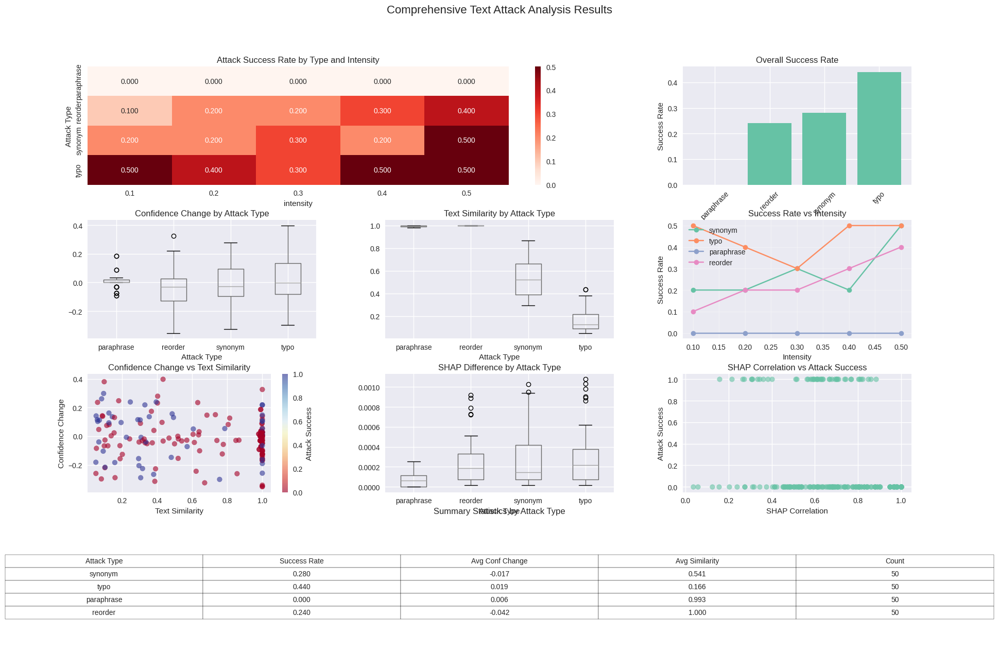

Results exported to text_attack_results.csv
Processed 200 successful experiments

Top 10 most successful attacks:
    attack_type  intensity  confidence_change  attack_success
25         typo        0.1           0.397190           False
29         typo        0.5           0.379956           False
137     reorder        0.3           0.325814           False
69         typo        0.5           0.298093            True
183     synonym        0.4           0.279098           False
128        typo        0.4           0.260915            True
27         typo        0.3           0.247309           False
184     synonym        0.5           0.238969            True
26         typo        0.2           0.238715            True
9          typo        0.5           0.236141           False


In [ ]:
# Run full analysis
analyzer = run_full_text_attack_analysis(
    text_file_path="/content/drive/MyDrive/Colab Notebooks/Justtext.txt",
    predict_fn=predict_fn,
    tokenizer=tokenizer,
    attack_types=['synonym', 'typo', 'paraphrase', 'reorder'],
    intensity_levels=[0.1, 0.2, 0.3, 0.4, 0.5],
    max_samples=10,  # Adjust based on your computational resources
    include_shap=True,
    export_results=True
)

# Access results
results_df = pd.DataFrame([r for r in analyzer.results if r.get('success', False)])
print(f"Processed {len(results_df)} successful experiments")

# Additional analysis
print("\nTop 10 most successful attacks:")
print(results_df.nlargest(10, 'confidence_change')[['attack_type', 'intensity', 'confidence_change', 'attack_success']])

Successfully loaded 527 texts from /content/drive/MyDrive/Colab Notebooks/Justtext.txt
Loaded 527 texts from file
Sample texts (first 3):
  1: text,label,split,name...
  2: " Uday Umesh Lalit, J. These appeals arise out of the Judgment and Order dated 09.12.2015 passed by ...
  3: " Indira Banerjee, J. These appeals are against the judgment and order dated 21.11.2006 passed by th...
Loaded 527 text samples
Using random sample of 10 texts from 527 total
Running InLegalBERT embedding noise analysis...
Text samples: 10
Noise levels: [0.01, 0.05, 0.1, 0.15, 0.2, 0.3]
Noise types: ['gaussian', 'uniform', 'targeted']
Total experiments: 180


Running noise experiments:   0%|          | 0/180 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.13s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.30s/it]               
Running noise experiments:   1%|          | 1/180 [00:20<1:01:22, 20.57s/it]

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.25s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.33s/it]               
Running noise experiments:   1%|          | 2/180 [00:41<1:01:17, 20.66s/it]

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.20s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.36s/it]               
Running noise experiments:   2%|▏         | 3/180 [01:02<1:01:00, 20.68s/it]

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.18s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.28s/it]               
Running noise experiments:   2%|▏         | 4/180 [01:22<1:00:35, 20.65s/it]

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.16s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.25s/it]               
Running noise experiments:   3%|▎         | 5/180 [01:43<1:00:08, 20.62s/it]

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.18s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.32s/it]               
Running noise experiments:   3%|▎         | 6/180 [02:03<59:48, 20.62s/it]  

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.19s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.33s/it]               
Running noise experiments:   4%|▍         | 7/180 [02:24<59:31, 20.64s/it]

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.22s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.34s/it]               
Running noise experiments:   4%|▍         | 8/180 [02:45<59:14, 20.66s/it]

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.19s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.32s/it]               
Running noise experiments:   5%|▌         | 9/180 [03:05<58:53, 20.66s/it]

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.18s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.31s/it]               
Running noise experiments:   6%|▌         | 10/180 [03:26<58:31, 20.66s/it]

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.21s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.35s/it]               
Running noise experiments:   6%|▌         | 11/180 [03:47<58:13, 20.67s/it]

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.24s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.30s/it]               
Running noise experiments:   7%|▋         | 12/180 [04:07<57:53, 20.68s/it]

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.21s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.31s/it]               
Running noise experiments:   7%|▋         | 13/180 [04:28<57:32, 20.67s/it]

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.15s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.31s/it]               
Running noise experiments:   8%|▊         | 14/180 [04:49<57:08, 20.66s/it]

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.25s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.32s/it]               
Running noise experiments:   8%|▊         | 15/180 [05:09<56:51, 20.67s/it]

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.16s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.28s/it]               
Running noise experiments:   9%|▉         | 16/180 [05:30<56:26, 20.65s/it]

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.15s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.23s/it]               
Running noise experiments:   9%|▉         | 17/180 [05:50<55:59, 20.61s/it]

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.17s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:10, 10.28s/it]               
Running noise experiments:  10%|█         | 18/180 [06:11<55:38, 20.61s/it]

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:35, 35.31s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:35, 35.51s/it]               
Running noise experiments:  11%|█         | 19/180 [07:22<1:35:57, 35.76s/it]

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:35, 35.65s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:35, 35.29s/it]               
Running noise experiments:  11%|█         | 20/180 [08:33<2:03:43, 46.40s/it]

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:35, 35.58s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:35, 35.26s/it]               
Running noise experiments:  12%|█▏        | 21/180 [09:44<2:22:35, 53.81s/it]

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:35, 35.43s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:35, 35.46s/it]               
Running noise experiments:  12%|█▏        | 22/180 [10:56<2:35:23, 59.01s/it]

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:35, 35.56s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:35, 35.31s/it]               
Running noise experiments:  13%|█▎        | 23/180 [12:07<2:43:55, 62.65s/it]

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:35, 35.65s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:35, 35.51s/it]               
Running noise experiments:  13%|█▎        | 24/180 [13:18<2:49:43, 65.28s/it]

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:35, 35.50s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:35, 35.48s/it]               
Running noise experiments:  14%|█▍        | 25/180 [14:29<2:53:15, 67.07s/it]

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:35, 35.43s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:35, 35.41s/it]               
Running noise experiments:  14%|█▍        | 26/180 [15:40<2:55:14, 68.28s/it]

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:35, 35.56s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:35, 35.43s/it]               
Running noise experiments:  15%|█▌        | 27/180 [16:52<2:56:22, 69.17s/it]

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:35, 35.58s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:35, 35.48s/it]               
Running noise experiments:  16%|█▌        | 28/180 [18:03<2:56:51, 69.81s/it]

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:35, 35.50s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:35, 35.47s/it]               
Running noise experiments:  16%|█▌        | 29/180 [19:14<2:56:44, 70.23s/it]

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:35, 35.68s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:35, 35.55s/it]               
Running noise experiments:  17%|█▋        | 30/180 [20:26<2:56:30, 70.61s/it]

  0%|          | 0/498 [00:00<?, ?it/s]




PartitionExplainer explainer: 2it [00:35, 35.55s/it]               
Running noise experiments:   0%|          | 2/900 [26:24<197:33:50, 792.02s/it]


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:36, 36.40s/it]               
Running noise experiments:  17%|█▋        | 31/180 [21:38<2:56:31, 71.08s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:35, 35.77s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:35, 35.46s/it]               
Running noise experiments:  18%|█▊        | 32/180 [22:49<2:55:38, 71.21s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:35, 35.68s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:35, 35.58s/it]               
Running noise experiments:  18%|█▊        | 33/180 [24:01<2:54:41, 71.30s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:35, 35.71s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:35, 35.63s/it]               
Running noise experiments:  19%|█▉        | 34/180 [25:13<2:53:42, 71.39s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:35, 35.65s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:35, 35.58s/it]               
Running noise experiments:  19%|█▉        | 35/180 [26:24<2:52:35, 71.42s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:35, 35.58s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:35, 35.51s/it]               
Running noise experiments:  20%|██        | 36/180 [27:35<2:51:21, 71.40s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:24, 84.93s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:23, 83.55s/it]               
Running noise experiments:  21%|██        | 37/180 [30:24<3:59:50, 100.63s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:24, 84.53s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:23, 83.38s/it]               
Running noise experiments:  21%|██        | 38/180 [33:12<4:46:11, 120.93s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:24, 84.69s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:23, 83.71s/it]               
Running noise experiments:  22%|██▏       | 39/180 [36:01<5:17:54, 135.28s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:24, 84.78s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:23, 83.66s/it]               
Running noise experiments:  22%|██▏       | 40/180 [38:50<5:39:07, 145.34s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:24, 84.75s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:23, 83.37s/it]               
Running noise experiments:  23%|██▎       | 41/180 [41:39<5:52:47, 152.29s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:24, 84.59s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:23, 83.83s/it]               
Running noise experiments:  23%|██▎       | 42/180 [44:27<6:01:38, 157.23s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:24, 84.58s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:24, 84.88s/it]               
Running noise experiments:  24%|██▍       | 43/180 [47:17<6:07:38, 161.01s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:24, 84.89s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:23, 83.09s/it]               
Running noise experiments:  24%|██▍       | 44/180 [50:06<6:09:57, 163.21s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:24, 84.39s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:23, 83.23s/it]               
Running noise experiments:  25%|██▌       | 45/180 [52:54<6:10:27, 164.65s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:24, 84.43s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:23, 83.21s/it]               
Running noise experiments:  26%|██▌       | 46/180 [55:42<6:09:57, 165.65s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:24, 84.09s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:23, 83.04s/it]               
Running noise experiments:  26%|██▌       | 47/180 [58:29<6:08:25, 166.21s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:24, 84.21s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:23, 83.24s/it]               
Running noise experiments:  27%|██▋       | 48/180 [1:01:17<6:06:43, 166.69s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:24, 84.25s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:23, 83.23s/it]               
Running noise experiments:  27%|██▋       | 49/180 [1:04:05<6:04:41, 167.04s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:24, 84.19s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:23, 83.29s/it]               
Running noise experiments:  28%|██▊       | 50/180 [1:06:53<6:02:26, 167.28s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:24, 84.14s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:23, 83.04s/it]               
Running noise experiments:  28%|██▊       | 51/180 [1:09:40<5:59:49, 167.36s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:23, 83.89s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:23, 83.34s/it]               
Running noise experiments:  29%|██▉       | 52/180 [1:12:28<5:57:11, 167.43s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:24, 84.84s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:23, 83.50s/it]               
Running noise experiments:  29%|██▉       | 53/180 [1:15:16<5:55:12, 167.81s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:25, 85.42s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:23, 83.24s/it]               
Running noise experiments:  30%|███       | 54/180 [1:18:05<5:53:10, 168.18s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:04, 64.38s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:03, 63.74s/it]               
Running noise experiments:  31%|███       | 55/180 [1:20:14<5:25:32, 156.26s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:04, 64.50s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:03, 63.82s/it]               
Running noise experiments:  31%|███       | 56/180 [1:22:23<5:05:49, 147.98s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:04, 64.39s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:03, 63.83s/it]               
Running noise experiments:  32%|███▏      | 57/180 [1:24:31<4:51:24, 142.15s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:04, 64.52s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:03, 63.66s/it]               
Running noise experiments:  32%|███▏      | 58/180 [1:26:40<4:40:43, 138.06s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:04, 64.45s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:03, 63.73s/it]               
Running noise experiments:  33%|███▎      | 59/180 [1:28:48<4:32:38, 135.19s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:04, 64.17s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:03, 63.71s/it]               
Running noise experiments:  33%|███▎      | 60/180 [1:30:56<4:26:11, 133.10s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:04, 64.62s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:03, 63.58s/it]               
Running noise experiments:  34%|███▍      | 61/180 [1:33:05<4:21:16, 131.73s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:04, 64.71s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:03, 63.84s/it]               
Running noise experiments:  34%|███▍      | 62/180 [1:35:14<4:17:23, 130.88s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:04, 64.47s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:03, 63.86s/it]               
Running noise experiments:  35%|███▌      | 63/180 [1:37:22<4:13:55, 130.22s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:04, 64.38s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:03, 63.61s/it]               
Running noise experiments:  36%|███▌      | 64/180 [1:39:31<4:10:38, 129.64s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:04, 64.82s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:03, 63.62s/it]               
Running noise experiments:  36%|███▌      | 65/180 [1:41:39<4:07:59, 129.38s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:05, 65.06s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:03, 63.86s/it]               
Running noise experiments:  37%|███▋      | 66/180 [1:43:49<4:05:45, 129.35s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:04, 64.11s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:03, 63.98s/it]               
Running noise experiments:  37%|███▋      | 67/180 [1:45:57<4:03:04, 129.07s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:04, 64.31s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:03, 63.52s/it]               
Running noise experiments:  38%|███▊      | 68/180 [1:48:05<4:00:25, 128.80s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:04, 64.14s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:03, 63.58s/it]               
Running noise experiments:  38%|███▊      | 69/180 [1:50:13<3:57:51, 128.57s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:04, 64.09s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:03, 63.46s/it]               
Running noise experiments:  39%|███▉      | 70/180 [1:52:21<3:55:20, 128.37s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:04, 64.03s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:03, 63.46s/it]               
Running noise experiments:  39%|███▉      | 71/180 [1:54:29<3:52:53, 128.20s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:04, 64.17s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [01:03, 63.68s/it]               
Running noise experiments:  40%|████      | 72/180 [1:56:37<3:50:45, 128.20s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.11s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.24s/it]               
Running noise experiments:  41%|████      | 73/180 [1:57:10<2:57:26, 99.50s/it] 

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.12s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.26s/it]               
Running noise experiments:  41%|████      | 74/180 [1:57:42<2:20:18, 79.42s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.12s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.12s/it]               
Running noise experiments:  42%|████▏     | 75/180 [1:58:15<1:54:18, 65.32s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.16s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.22s/it]               
Running noise experiments:  42%|████▏     | 76/180 [1:58:47<1:36:11, 55.49s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.14s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.27s/it]               
Running noise experiments:  43%|████▎     | 77/180 [1:59:20<1:23:28, 48.63s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.11s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.19s/it]               
Running noise experiments:  43%|████▎     | 78/180 [1:59:52<1:14:26, 43.79s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.14s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.19s/it]               
Running noise experiments:  44%|████▍     | 79/180 [2:00:25<1:08:00, 40.41s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.12s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.22s/it]               
Running noise experiments:  44%|████▍     | 80/180 [2:00:57<1:03:23, 38.04s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.17s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.24s/it]               
Running noise experiments:  45%|████▌     | 81/180 [2:01:30<1:00:04, 36.41s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.13s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.15s/it]               
Running noise experiments:  46%|████▌     | 82/180 [2:02:03<57:32, 35.23s/it]  

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.15s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.22s/it]               
Running noise experiments:  46%|████▌     | 83/180 [2:02:35<55:39, 34.42s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.17s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.21s/it]               
Running noise experiments:  47%|████▋     | 84/180 [2:03:08<54:10, 33.86s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.17s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.24s/it]               
Running noise experiments:  47%|████▋     | 85/180 [2:03:40<53:01, 33.48s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.06s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.24s/it]               
Running noise experiments:  48%|████▊     | 86/180 [2:04:13<51:59, 33.18s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.12s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.14s/it]               
Running noise experiments:  48%|████▊     | 87/180 [2:04:45<51:05, 32.96s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.12s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.15s/it]               
Running noise experiments:  49%|████▉     | 88/180 [2:05:18<50:19, 32.82s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.19s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.13s/it]               
Running noise experiments:  49%|████▉     | 89/180 [2:05:50<49:37, 32.73s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.14s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:16, 16.19s/it]               
Running noise experiments:  50%|█████     | 90/180 [2:06:23<48:59, 32.66s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

Running noise experiments:  51%|█████     | 91/180 [2:06:40<41:50, 28.21s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

Running noise experiments:  51%|█████     | 92/180 [2:06:58<36:45, 25.06s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

Running noise experiments:  52%|█████▏    | 93/180 [2:07:16<33:06, 22.83s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

Running noise experiments:  52%|█████▏    | 94/180 [2:07:34<30:31, 21.29s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

Running noise experiments:  53%|█████▎    | 95/180 [2:07:51<28:39, 20.23s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

Running noise experiments:  53%|█████▎    | 96/180 [2:08:09<27:17, 19.49s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

Running noise experiments:  54%|█████▍    | 97/180 [2:08:27<26:15, 18.98s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

Running noise experiments:  54%|█████▍    | 98/180 [2:08:45<25:24, 18.60s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

Running noise experiments:  55%|█████▌    | 99/180 [2:09:02<24:43, 18.31s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

Running noise experiments:  56%|█████▌    | 100/180 [2:09:20<24:09, 18.12s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

Running noise experiments:  56%|█████▌    | 101/180 [2:09:38<23:42, 18.01s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

Running noise experiments:  57%|█████▋    | 102/180 [2:09:55<23:19, 17.95s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

Running noise experiments:  57%|█████▋    | 103/180 [2:10:13<22:58, 17.90s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

Running noise experiments:  58%|█████▊    | 104/180 [2:10:31<22:35, 17.84s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

Running noise experiments:  58%|█████▊    | 105/180 [2:10:49<22:15, 17.80s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

Running noise experiments:  59%|█████▉    | 106/180 [2:11:06<21:55, 17.78s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

Running noise experiments:  59%|█████▉    | 107/180 [2:11:24<21:37, 17.77s/it]

  0%|          | 0/498 [00:00<?, ?it/s]

  0%|          | 0/498 [00:00<?, ?it/s]

Running noise experiments:  60%|██████    | 108/180 [2:11:42<21:17, 17.75s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.10s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.83s/it]               
Running noise experiments:  61%|██████    | 109/180 [2:12:35<33:34, 28.37s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.13s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.07s/it]               
Running noise experiments:  61%|██████    | 110/180 [2:13:27<41:31, 35.59s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.34s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.20s/it]               
Running noise experiments:  62%|██████▏   | 111/180 [2:14:20<46:51, 40.75s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.34s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.32s/it]               
Running noise experiments:  62%|██████▏   | 112/180 [2:15:13<50:18, 44.39s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.23s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.20s/it]               
Running noise experiments:  63%|██████▎   | 113/180 [2:16:06<52:20, 46.88s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.42s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.39s/it]               
Running noise experiments:  63%|██████▎   | 114/180 [2:16:59<53:35, 48.73s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.32s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.33s/it]               
Running noise experiments:  64%|██████▍   | 115/180 [2:17:52<54:08, 49.97s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.29s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.29s/it]               
Running noise experiments:  64%|██████▍   | 116/180 [2:18:45<54:13, 50.83s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.38s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.30s/it]               
Running noise experiments:  65%|██████▌   | 117/180 [2:19:37<54:01, 51.46s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.35s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.21s/it]               
Running noise experiments:  66%|██████▌   | 118/180 [2:20:30<53:35, 51.86s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.36s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.24s/it]               
Running noise experiments:  66%|██████▌   | 119/180 [2:21:23<53:01, 52.15s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.38s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.27s/it]               
Running noise experiments:  67%|██████▋   | 120/180 [2:22:16<52:22, 52.37s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.43s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.32s/it]               
Running noise experiments:  67%|██████▋   | 121/180 [2:23:09<51:40, 52.56s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.36s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.36s/it]               
Running noise experiments:  68%|██████▊   | 122/180 [2:24:02<50:55, 52.68s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.31s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.45s/it]               
Running noise experiments:  68%|██████▊   | 123/180 [2:24:55<50:08, 52.78s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.31s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.27s/it]               
Running noise experiments:  69%|██████▉   | 124/180 [2:25:48<49:16, 52.79s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.36s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.31s/it]               
Running noise experiments:  69%|██████▉   | 125/180 [2:26:41<48:25, 52.82s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.22s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:26, 26.31s/it]               
Running noise experiments:  70%|███████   | 126/180 [2:27:33<47:31, 52.81s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.50s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.37s/it]               
Running noise experiments:  71%|███████   | 127/180 [2:29:07<57:20, 64.91s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.33s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.36s/it]               
Running noise experiments:  71%|███████   | 128/180 [2:30:40<1:03:33, 73.33s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.58s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.60s/it]               
Running noise experiments:  72%|███████▏  | 129/180 [2:32:13<1:07:28, 79.38s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.68s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.52s/it]               
Running noise experiments:  72%|███████▏  | 130/180 [2:33:46<1:09:40, 83.61s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.61s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.52s/it]               
Running noise experiments:  73%|███████▎  | 131/180 [2:35:20<1:10:41, 86.56s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:47, 47.31s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.48s/it]               
Running noise experiments:  73%|███████▎  | 132/180 [2:36:54<1:11:03, 88.82s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.65s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.51s/it]               
Running noise experiments:  74%|███████▍  | 133/180 [2:38:27<1:10:39, 90.21s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.84s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.48s/it]               
Running noise experiments:  74%|███████▍  | 134/180 [2:40:01<1:09:56, 91.23s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.70s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.26s/it]               
Running noise experiments:  75%|███████▌  | 135/180 [2:41:34<1:08:52, 91.84s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.61s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.48s/it]               
Running noise experiments:  76%|███████▌  | 136/180 [2:43:08<1:07:41, 92.31s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.79s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.33s/it]               
Running noise experiments:  76%|███████▌  | 137/180 [2:44:41<1:06:23, 92.64s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.54s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.33s/it]               
Running noise experiments:  77%|███████▋  | 138/180 [2:46:14<1:04:57, 92.80s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.53s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.58s/it]               
Running noise experiments:  77%|███████▋  | 139/180 [2:47:48<1:03:32, 92.98s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.52s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.29s/it]               
Running noise experiments:  78%|███████▊  | 140/180 [2:49:21<1:02:00, 93.02s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.74s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.50s/it]               
Running noise experiments:  78%|███████▊  | 141/180 [2:50:54<1:00:33, 93.17s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.82s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.55s/it]               
Running noise experiments:  79%|███████▉  | 142/180 [2:52:28<59:06, 93.32s/it]  

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.47s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.19s/it]               
Running noise experiments:  79%|███████▉  | 143/180 [2:54:01<57:28, 93.21s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.58s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:46, 46.38s/it]               
Running noise experiments:  80%|████████  | 144/180 [2:55:34<55:55, 93.22s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:04, 124.63s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:03, 123.95s/it]              
Running noise experiments:  81%|████████  | 145/180 [2:59:43<1:21:38, 139.96s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:05, 125.75s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:04, 124.37s/it]              
Running noise experiments:  81%|████████  | 146/180 [3:03:54<1:38:06, 173.14s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:04, 124.79s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:04, 124.32s/it]              
Running noise experiments:  82%|████████▏ | 147/180 [3:08:03<1:47:49, 196.06s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:04, 124.93s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:03, 123.77s/it]              
Running noise experiments:  82%|████████▏ | 148/180 [3:12:12<1:53:03, 211.98s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:04, 124.77s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:03, 123.99s/it]              
Running noise experiments:  83%|████████▎ | 149/180 [3:16:22<1:55:17, 223.14s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:04, 124.69s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:03, 123.88s/it]              
Running noise experiments:  83%|████████▎ | 150/180 [3:20:31<1:55:27, 230.90s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:05, 125.19s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:04, 124.46s/it]              
Running noise experiments:  84%|████████▍ | 151/180 [3:24:41<1:54:23, 236.66s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:05, 125.18s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:04, 124.25s/it]              
Running noise experiments:  84%|████████▍ | 152/180 [3:28:51<1:52:17, 240.62s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:04, 124.81s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:03, 123.91s/it]              
Running noise experiments:  85%|████████▌ | 153/180 [3:33:00<1:49:25, 243.18s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:06, 126.41s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:03, 123.83s/it]              
Running noise experiments:  86%|████████▌ | 154/180 [3:37:10<1:46:21, 245.43s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:05, 125.07s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:04, 124.45s/it]              
Running noise experiments:  86%|████████▌ | 155/180 [3:41:20<1:42:49, 246.79s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:04, 124.97s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:04, 124.78s/it]              
Running noise experiments:  87%|████████▋ | 156/180 [3:45:31<1:39:07, 247.81s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:04, 124.87s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:04, 124.48s/it]              
Running noise experiments:  87%|████████▋ | 157/180 [3:49:40<1:35:13, 248.40s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:04, 124.78s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:05, 125.22s/it]              
Running noise experiments:  88%|████████▊ | 158/180 [3:53:51<1:31:18, 249.01s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:04, 124.63s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:04, 124.15s/it]              
Running noise experiments:  88%|████████▊ | 159/180 [3:58:00<1:27:10, 249.07s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:05, 125.11s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:04, 124.07s/it]              
Running noise experiments:  89%|████████▉ | 160/180 [4:02:10<1:23:04, 249.23s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:05, 125.26s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:05, 125.16s/it]              
Running noise experiments:  89%|████████▉ | 161/180 [4:06:21<1:19:04, 249.73s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:06, 126.91s/it]              


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [02:06, 126.05s/it]              
Running noise experiments:  90%|█████████ | 162/180 [4:10:34<1:15:14, 250.83s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.51s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.66s/it]               
Running noise experiments:  91%|█████████ | 163/180 [4:11:21<53:46, 189.80s/it]  

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.54s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.81s/it]               
Running noise experiments:  91%|█████████ | 164/180 [4:12:09<39:14, 147.13s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.58s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.72s/it]               
Running noise experiments:  92%|█████████▏| 165/180 [4:12:56<29:18, 117.26s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.65s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.57s/it]               
Running noise experiments:  92%|█████████▏| 166/180 [4:13:44<22:28, 96.31s/it] 

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.69s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.74s/it]               
Running noise experiments:  93%|█████████▎| 167/180 [4:14:32<17:42, 81.72s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.71s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.79s/it]               
Running noise experiments:  93%|█████████▎| 168/180 [4:15:19<14:18, 71.52s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.75s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.74s/it]               
Running noise experiments:  94%|█████████▍| 169/180 [4:16:07<11:48, 64.38s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.78s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.60s/it]               
Running noise experiments:  94%|█████████▍| 170/180 [4:16:55<09:53, 59.36s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.66s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.69s/it]               
Running noise experiments:  95%|█████████▌| 171/180 [4:17:42<08:22, 55.83s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.64s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.62s/it]               
Running noise experiments:  96%|█████████▌| 172/180 [4:18:30<07:06, 53.33s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.68s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.59s/it]               
Running noise experiments:  96%|█████████▌| 173/180 [4:19:17<06:01, 51.59s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.62s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.66s/it]               
Running noise experiments:  97%|█████████▋| 174/180 [4:20:05<05:02, 50.37s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.71s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.73s/it]               
Running noise experiments:  97%|█████████▋| 175/180 [4:20:52<04:07, 49.56s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.64s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.79s/it]               
Running noise experiments:  98%|█████████▊| 176/180 [4:21:40<03:15, 48.99s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.67s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.66s/it]               
Running noise experiments:  98%|█████████▊| 177/180 [4:22:28<02:25, 48.56s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.71s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.66s/it]               
Running noise experiments:  99%|█████████▉| 178/180 [4:23:15<01:36, 48.28s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.65s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.59s/it]               
Running noise experiments:  99%|█████████▉| 179/180 [4:24:03<00:48, 48.04s/it]

  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.63s/it]               


  0%|          | 0/498 [00:00<?, ?it/s]


PartitionExplainer explainer: 2it [00:23, 23.64s/it]               
Running noise experiments: 100%|██████████| 180/180 [4:24:50<00:00, 88.28s/it]



Completed 180 experiments
Successful experiments: 180
Success rate: 100.0%
INLEGALBERT EMBEDDING NOISE ATTACK ANALYSIS

Dataset Overview:
  Total experiments: 180
  Unique texts analyzed: 10
  Noise types tested: gaussian, uniform, targeted
  Noise levels: [0.01, 0.05, 0.1, 0.15, 0.2, 0.3]

PREDICTION FLIP ANALYSIS

By Noise Level:
               mean     std  count
noise_level                       
0.01         0.0000  0.0000     30
0.05         0.2000  0.4068     30
0.10         0.4000  0.4983     30
0.15         0.5333  0.5074     30
0.20         0.4667  0.5074     30
0.30         0.6667  0.4795     30

By Noise Type:
              mean     std  count
noise_type                       
gaussian    0.3833  0.4903     60
targeted    0.3667  0.4860     60
uniform     0.3833  0.4903     60

CONFIDENCE CHANGE ANALYSIS
                          mean     std     min     max
noise_type noise_level                                
gaussian   0.01        -0.0008  0.0139 -0.0337  0.0132
      

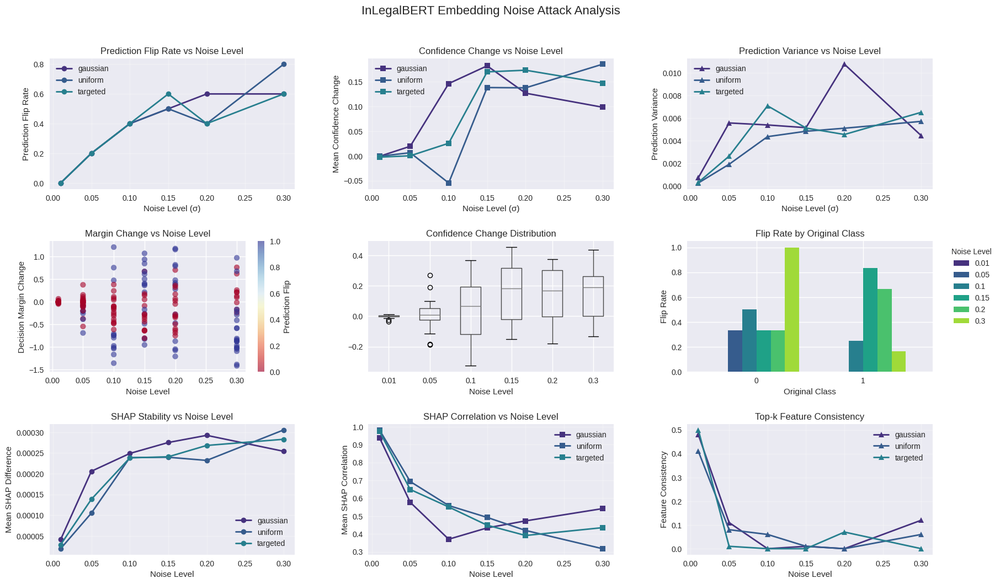

Results exported to inlegalbert_noise_results.csv


In [ ]:
# ================= INLEGALBERT EMBEDDING NOISE ATTACK ANALYZER =================

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import torch
import torch.nn as nn
from collections import defaultdict
from tqdm import tqdm
import warnings
warnings.filterwarnings('ignore')

# Set plotting style
plt.style.use('seaborn-v0_8')
sns.set_palette("viridis")

class InLegalBERTNoiseAnalyzer:
    """
    Specialized analyzer for InLegalBERT embedding noise attacks
    """

    def __init__(self, model, tokenizer, device='cuda'):
        self.model = model
        self.tokenizer = tokenizer
        self.device = device

        # Results storage
        self.results = []
        self.summary_stats = {}

        # Create base prediction function
        self.base_predict_fn = self._create_base_predict_function()

    def _create_base_predict_function(self):
        """Create clean prediction function without noise"""
        def predict_fn(texts):
            if isinstance(texts, np.ndarray):
                texts = texts.tolist()

            inputs = self.tokenizer(
                texts,
                return_tensors="pt",
                padding=True,
                truncation=True,
                max_length=512,
                return_token_type_ids=False
            )
            inputs = {k: v.to(self.device) for k, v in inputs.items()}

            with torch.no_grad():
                # Standard forward pass through your model
                logits = self.model(**inputs)
                probs = torch.nn.functional.softmax(logits, dim=1)

            return probs.cpu().numpy()

        return predict_fn

    def _create_noisy_predict_function_v2(self, noise_std, noise_type='gaussian'):
        """Simplified noise injection method for InLegalBERT - more reliable"""
        def noisy_predict_fn(texts):
            if isinstance(texts, np.ndarray):
                texts = texts.tolist()

            inputs = self.tokenizer(
                texts,
                return_tensors="pt",
                padding=True,
                truncation=True,
                max_length=512,
                return_token_type_ids=False
            )
            inputs = {k: v.to(self.device) for k, v in inputs.items()}

            with torch.no_grad():
                try:
                    # Get word embeddings and add noise
                    word_embeddings = self.model.bert.embeddings.word_embeddings(inputs['input_ids'])

                    # Generate noise
                    if noise_type == 'gaussian':
                        noise = torch.randn_like(word_embeddings) * noise_std
                    elif noise_type == 'uniform':
                        noise = (torch.rand_like(word_embeddings) - 0.5) * 2 * noise_std
                    elif noise_type == 'targeted':
                        noise = torch.zeros_like(word_embeddings)
                        embed_dim = word_embeddings.size(-1)
                        half_dim = embed_dim // 2
                        noise[..., :half_dim] = torch.randn_like(noise[..., :half_dim]) * noise_std
                    else:
                        noise = torch.randn_like(word_embeddings) * noise_std

                    # Add noise to embeddings
                    noisy_word_embeddings = word_embeddings + noise

                    # Replace the word embeddings in the embedding layer temporarily
                    original_weight = self.model.bert.embeddings.word_embeddings.weight.clone()

                    # Create a custom embedding layer with noisy embeddings
                    batch_size, seq_len = inputs['input_ids'].shape

                    # Manual forward pass through embeddings with noise
                    position_ids = torch.arange(seq_len, dtype=torch.long, device=self.device)
                    position_ids = position_ids.unsqueeze(0).expand(batch_size, -1)

                    position_embeddings = self.model.bert.embeddings.position_embeddings(position_ids)
                    token_type_embeddings = self.model.bert.embeddings.token_type_embeddings(
                        torch.zeros_like(inputs['input_ids'])
                    )

                    # Complete embeddings with noise
                    embeddings = noisy_word_embeddings + position_embeddings + token_type_embeddings
                    embeddings = self.model.bert.embeddings.LayerNorm(embeddings)
                    embeddings = self.model.bert.embeddings.dropout(embeddings)

                    # Forward through encoder with proper attention mask
                    extended_attention_mask = inputs['attention_mask'][:, None, None, :]
                    extended_attention_mask = extended_attention_mask.to(dtype=embeddings.dtype)
                    extended_attention_mask = (1.0 - extended_attention_mask) * torch.finfo(embeddings.dtype).min

                    encoder_outputs = self.model.bert.encoder(
                        embeddings,
                        attention_mask=extended_attention_mask,
                        head_mask=None,
                        encoder_hidden_states=None,
                        encoder_attention_mask=None,
                        past_key_values=None,
                        use_cache=None,
                        output_attentions=False,
                        output_hidden_states=False,
                        return_dict=True,
                    )

                    sequence_output = encoder_outputs.last_hidden_state

                    # Apply pooler and classifier
                    pooled_output = self.model.bert.pooler(sequence_output)
                    pooled_output = self.model.drop(pooled_output)
                    logits = self.model.out(pooled_output)

                except Exception as e:
                    print(f"Simplified noise injection failed: {e}, using clean prediction")
                    logits = self.model(**inputs)

                probs = torch.nn.functional.softmax(logits, dim=1)

            return probs.cpu().numpy()

        return noisy_predict_fn
        """Create prediction function with embedding noise for InLegalBERT"""
        def noisy_predict_fn(texts):
            if isinstance(texts, np.ndarray):
                texts = texts.tolist()

            inputs = self.tokenizer(
                texts,
                return_tensors="pt",
                padding=True,
                truncation=True,
                max_length=512,
                return_token_type_ids=False
            )
            inputs = {k: v.to(self.device) for k, v in inputs.items()}

            with torch.no_grad():
                try:
                    # Method 1: Direct embedding manipulation (most reliable for BERT)
                    # Get embeddings from BERT embedding layer
                    embeddings = self.model.bert.embeddings.word_embeddings(inputs['input_ids'])

                    # Add positional and token type embeddings
                    seq_length = inputs['input_ids'].size(1)
                    position_ids = torch.arange(seq_length, dtype=torch.long, device=self.device)
                    position_ids = position_ids.unsqueeze(0).expand_as(inputs['input_ids'])

                    position_embeddings = self.model.bert.embeddings.position_embeddings(position_ids)
                    token_type_embeddings = self.model.bert.embeddings.token_type_embeddings(
                        torch.zeros_like(inputs['input_ids'])
                    )

                    # Complete embeddings (before noise)
                    complete_embeddings = embeddings + position_embeddings + token_type_embeddings
                    complete_embeddings = self.model.bert.embeddings.LayerNorm(complete_embeddings)
                    complete_embeddings = self.model.bert.embeddings.dropout(complete_embeddings)

                    # Add noise to word embeddings only (more realistic attack)
                    if noise_type == 'gaussian':
                        noise = torch.randn_like(embeddings) * noise_std
                    elif noise_type == 'uniform':
                        noise = (torch.rand_like(embeddings) - 0.5) * 2 * noise_std
                    elif noise_type == 'targeted':
                        # Target specific dimensions
                        noise = torch.zeros_like(embeddings)
                        embed_dim = embeddings.size(-1)  # 768 for BERT
                        half_dim = embed_dim // 2
                        noise[..., :half_dim] = torch.randn_like(noise[..., :half_dim]) * noise_std
                    else:
                        noise = torch.randn_like(embeddings) * noise_std

                    # Apply noise to word embeddings
                    noisy_word_embeddings = embeddings + noise

                    # Reconstruct complete noisy embeddings
                    noisy_complete_embeddings = (noisy_word_embeddings +
                                               position_embeddings +
                                               token_type_embeddings)
                    noisy_complete_embeddings = self.model.bert.embeddings.LayerNorm(noisy_complete_embeddings)
                    noisy_complete_embeddings = self.model.bert.embeddings.dropout(noisy_complete_embeddings)

                    # Forward pass through BERT encoder - FIX ATTENTION MASK DTYPE
                    # Convert attention mask to proper dtype (float)
                    attention_mask = inputs['attention_mask'].float()

                    encoder_outputs = self.model.bert.encoder(
                        noisy_complete_embeddings,
                        attention_mask=attention_mask,
                        head_mask=None,
                        encoder_hidden_states=None,
                        encoder_attention_mask=None,
                        past_key_values=None,
                        use_cache=None,
                        output_attentions=False,
                        output_hidden_states=False,
                        return_dict=True,
                    )

                    sequence_output = encoder_outputs.last_hidden_state

                    # Apply pooler (uses CLS token)
                    pooled_output = self.model.bert.pooler(sequence_output)

                    # Apply classifier layers
                    pooled_output = self.model.drop(pooled_output)
                    logits = self.model.out(pooled_output)

                except Exception as e:
                    print(f"Noise injection failed: {e}")
                    try:
                        # Alternative method: Use inputs_embeds parameter directly
                        embeddings = self.model.bert.embeddings.word_embeddings(inputs['input_ids'])

                        # Add noise
                        if noise_type == 'gaussian':
                            noise = torch.randn_like(embeddings) * noise_std
                        elif noise_type == 'uniform':
                            noise = (torch.rand_like(embeddings) - 0.5) * 2 * noise_std
                        elif noise_type == 'targeted':
                            noise = torch.zeros_like(embeddings)
                            embed_dim = embeddings.size(-1)
                            half_dim = embed_dim // 2
                            noise[..., :half_dim] = torch.randn_like(noise[..., :half_dim]) * noise_std
                        else:
                            noise = torch.randn_like(embeddings) * noise_std

                        noisy_embeddings = embeddings + noise

                        # Try using the model's forward method with inputs_embeds
                        # Remove input_ids and use inputs_embeds instead
                        forward_inputs = {k: v for k, v in inputs.items() if k != 'input_ids'}
                        forward_inputs['inputs_embeds'] = noisy_embeddings

                        logits = self.model(**forward_inputs)

                    except Exception as e2:
                        print(f"Alternative method also failed: {e2}, falling back to clean prediction")
                        # Final fallback to clean prediction
                        logits = self.model(**inputs)

                probs = torch.nn.functional.softmax(logits, dim=1)

            return probs.cpu().numpy()

        return noisy_predict_fn



    def _run_single_noise_experiment(self, text, noise_type, noise_level, text_idx, include_shap):
        """Run a single embedding noise experiment"""

        try:
            # Get clean prediction
            clean_pred = self.base_predict_fn([text])
            clean_class = np.argmax(clean_pred)
            clean_confidence = np.max(clean_pred)

            # Create noisy prediction function (try v2 first, fallback to v1)
            try:
                noisy_predict_fn = self._create_noisy_predict_function_v2(noise_level, noise_type)
                # Test the function with a single prediction
                test_pred = noisy_predict_fn([text])
                if np.any(np.isnan(test_pred)) or np.any(np.isinf(test_pred)):
                    raise ValueError("NaN or Inf in predictions")
            except Exception as e:
                print(f"Using fallback noise method for text {text_idx}: {e}")
                noisy_predict_fn = self._create_noisy_predict_function(noise_level, noise_type)

            # Get noisy predictions (multiple samples for stability)
            noisy_preds = []
            successful_samples = 0
            max_attempts = 10

            for attempt in range(max_attempts):
                try:
                    noisy_pred = noisy_predict_fn([text])
                    noisy_preds.append(noisy_pred[0])
                    successful_samples += 1
                    if successful_samples >= 5:  # We want at least 5 successful samples
                        break
                except Exception as e:
                    if attempt < max_attempts - 1:
                        continue
                    else:
                        # If all attempts fail, use clean prediction as fallback
                        print(f"All noise attempts failed for text {text_idx}: {e}")
                        noisy_preds = [clean_pred[0]] * 5
                        break

            if not noisy_preds:
                # Emergency fallback
                noisy_preds = [clean_pred[0]] * 5

            # Average predictions
            avg_noisy_pred = np.mean(noisy_preds, axis=0)
            noisy_class = np.argmax(avg_noisy_pred)
            noisy_confidence = np.max(avg_noisy_pred)

            # Basic metrics
            prediction_flip = clean_class != noisy_class
            confidence_change = clean_confidence - noisy_confidence
            prediction_variance = np.var([np.max(pred) for pred in noisy_preds])

            # Logit analysis for binary classification
            if len(clean_pred[0]) == 2:
                clean_margin = clean_pred[0][1] - clean_pred[0][0]
                noisy_margin = avg_noisy_pred[1] - avg_noisy_pred[0]
                margin_change = clean_margin - noisy_margin
            else:
                # For multi-class, use top-2 difference
                clean_sorted = np.sort(clean_pred[0])
                noisy_sorted = np.sort(avg_noisy_pred)
                clean_margin = clean_sorted[-1] - clean_sorted[-2]
                noisy_margin = noisy_sorted[-1] - noisy_sorted[-2]
                margin_change = clean_margin - noisy_margin

            result = {
                'text_idx': text_idx,
                'noise_type': noise_type,
                'noise_level': noise_level,
                'original_text': text,
                'clean_pred': clean_pred[0],
                'noisy_pred': avg_noisy_pred,
                'clean_class': clean_class,
                'noisy_class': noisy_class,
                'clean_confidence': clean_confidence,
                'noisy_confidence': noisy_confidence,
                'prediction_flip': prediction_flip,
                'confidence_change': confidence_change,
                'prediction_variance': prediction_variance,
                'clean_margin': clean_margin,
                'noisy_margin': noisy_margin,
                'margin_change': margin_change,
                'successful_samples': successful_samples,
                'success': True
            }

            # Add SHAP analysis if requested
            if include_shap and successful_samples >= 3:
                try:
                    shap_metrics = self._compute_shap_metrics(text, noisy_predict_fn)
                    result.update(shap_metrics)
                except Exception as e:
                    result['shap_error'] = str(e)
                    result['shap_computed'] = False

            return result

        except Exception as e:
            # Return error result
            print(f"Complete experiment failed for text {text_idx}: {e}")
            return {
                'text_idx': text_idx,
                'noise_type': noise_type,
                'noise_level': noise_level,
                'success': False,
                'error': str(e)
            }

    def _compute_shap_metrics(self, text, noisy_predict_fn):
        """Compute SHAP-based metrics for noise robustness"""
        try:
            import shap

            # Create explainers with proper masker
            masker = shap.maskers.Text(self.tokenizer)
            base_explainer = shap.Explainer(self.base_predict_fn, masker)
            noisy_explainer = shap.Explainer(noisy_predict_fn, masker)

            # Get SHAP values
            base_shap = base_explainer([text])
            noisy_shap = noisy_explainer([text])

            # Extract values - handle different SHAP output formats
            if hasattr(base_shap, 'values'):
                base_values = base_shap.values[0]
                noisy_values = noisy_shap.values[0]
            else:
                base_values = base_shap[0].values
                noisy_values = noisy_shap[0].values

            # Ensure we're working with the right class (class 1 for binary)
            if len(base_values.shape) > 1 and base_values.shape[-1] > 1:
                base_values = base_values[:, 1]  # Class 1 for binary classification
                noisy_values = noisy_values[:, 1]

            # Compute SHAP metrics
            if len(base_values) > 0 and len(noisy_values) > 0:
                min_len = min(len(base_values), len(noisy_values))

                # SHAP difference
                shap_diff = np.mean(np.abs(base_values[:min_len] - noisy_values[:min_len]))

                # SHAP correlation
                base_abs = np.abs(base_values[:min_len])
                noisy_abs = np.abs(noisy_values[:min_len])

                if np.std(base_abs) > 1e-10 and np.std(noisy_abs) > 1e-10:
                    shap_correlation = np.corrcoef(base_abs, noisy_abs)[0, 1]
                    if np.isnan(shap_correlation):
                        shap_correlation = 0.0
                else:
                    shap_correlation = 1.0 if np.allclose(base_abs, noisy_abs) else 0.0

                # Top-k feature consistency
                k = min(10, min_len)
                if k > 0:
                    base_top_k = set(np.argsort(base_abs)[-k:])
                    noisy_top_k = set(np.argsort(noisy_abs)[-k:])
                    feature_consistency = len(base_top_k & noisy_top_k) / k
                else:
                    feature_consistency = 1.0

                # SHAP entropy change
                base_norm = base_abs / (np.sum(base_abs) + 1e-10)
                noisy_norm = noisy_abs / (np.sum(noisy_abs) + 1e-10)

                base_entropy = -np.sum(base_norm * np.log(base_norm + 1e-10))
                noisy_entropy = -np.sum(noisy_norm * np.log(noisy_norm + 1e-10))
                entropy_change = abs(base_entropy - noisy_entropy)

            else:
                shap_diff = 0.0
                shap_correlation = 1.0
                feature_consistency = 1.0
                entropy_change = 0.0

            return {
                'shap_difference': shap_diff,
                'shap_correlation': shap_correlation,
                'feature_consistency': feature_consistency,
                'shap_entropy_change': entropy_change,
                'shap_computed': True
            }

        except Exception as e:
            return {
                'shap_difference': np.nan,
                'shap_correlation': np.nan,
                'feature_consistency': np.nan,
                'shap_entropy_change': np.nan,
                'shap_computed': False,
                'shap_error': str(e)
            }

    def run_comprehensive_noise_analysis(self, text_list, noise_levels=None, noise_types=None,
                                       max_samples=None, include_shap=True):
        """
        Run comprehensive embedding noise analysis
        """
        if noise_levels is None:
            noise_levels = [0.01, 0.05, 0.1, 0.15, 0.2, 0.3]

        if noise_types is None:
            noise_types = ['gaussian']

        # Limit samples if specified
        if max_samples and len(text_list) > max_samples:
            import random
            text_sample = random.sample(text_list, max_samples)
            print(f"Using random sample of {max_samples} texts from {len(text_list)} total")
        else:
            text_sample = text_list

        print(f"Running InLegalBERT embedding noise analysis...")
        print(f"Text samples: {len(text_sample)}")
        print(f"Noise levels: {noise_levels}")
        print(f"Noise types: {noise_types}")
        print(f"Total experiments: {len(text_sample) * len(noise_levels) * len(noise_types)}")

        # Initialize results storage
        self.results = []

        # Progress tracking
        total_experiments = len(text_sample) * len(noise_levels) * len(noise_types)
        pbar = tqdm(total=total_experiments, desc="Running noise experiments")

        # Run experiments
        for text_idx, text in enumerate(text_sample):
            for noise_type in noise_types:
                for noise_level in noise_levels:
                    try:
                        result = self._run_single_noise_experiment(
                            text, noise_type, noise_level, text_idx, include_shap
                        )
                        self.results.append(result)

                    except Exception as e:
                        print(f"Error in experiment (text {text_idx}, {noise_type}, {noise_level}): {e}")
                        # Add failed experiment record
                        self.results.append({
                            'text_idx': text_idx,
                            'noise_type': noise_type,
                            'noise_level': noise_level,
                            'success': False,
                            'error': str(e)
                        })

                    pbar.update(1)

        pbar.close()

        # Compute summary statistics
        self._compute_summary_statistics()

        print(f"\nCompleted {len(self.results)} experiments")
        successful_count = sum(1 for r in self.results if r.get('success', False))
        print(f"Successful experiments: {successful_count}")
        print(f"Success rate: {successful_count / len(self.results) * 100:.1f}%")

        return self.results

    def _compute_summary_statistics(self):
        """Compute comprehensive summary statistics"""
        if not self.results:
            return

        # Filter successful results
        successful_results = [r for r in self.results if r.get('success', False)]

        if not successful_results:
            print("No successful results to analyze")
            return

        # Convert to DataFrame
        df = pd.DataFrame(successful_results)

        # Overall statistics
        self.summary_stats = {
            'total_experiments': len(successful_results),
            'unique_texts': df['text_idx'].nunique(),
            'noise_types': df['noise_type'].unique().tolist(),
            'noise_levels': sorted(df['noise_level'].unique().tolist())
        }

        # Prediction flip analysis
        flip_by_noise_level = df.groupby('noise_level')['prediction_flip'].agg(['mean', 'std', 'count'])
        flip_by_noise_type = df.groupby('noise_type')['prediction_flip'].agg(['mean', 'std', 'count'])
        flip_by_type_level = df.groupby(['noise_type', 'noise_level'])['prediction_flip'].agg(['mean', 'std', 'count'])

        self.summary_stats.update({
            'flip_by_noise_level': flip_by_noise_level,
            'flip_by_noise_type': flip_by_noise_type,
            'flip_by_type_level': flip_by_type_level
        })

        # Confidence and margin analysis
        confidence_stats = df.groupby(['noise_type', 'noise_level'])['confidence_change'].agg(['mean', 'std', 'min', 'max'])
        margin_stats = df.groupby(['noise_type', 'noise_level'])['margin_change'].agg(['mean', 'std', 'min', 'max'])
        variance_stats = df.groupby(['noise_type', 'noise_level'])['prediction_variance'].agg(['mean', 'std', 'min', 'max'])

        self.summary_stats.update({
            'confidence_change_stats': confidence_stats,
            'margin_change_stats': margin_stats,
            'prediction_variance_stats': variance_stats
        })

        # SHAP statistics (if available)
        if 'shap_difference' in df.columns:
            shap_mask = df['shap_computed'] == True
            if shap_mask.any():
                shap_diff_stats = df[shap_mask].groupby(['noise_type', 'noise_level'])['shap_difference'].agg(['mean', 'std', 'min', 'max'])
                shap_corr_stats = df[shap_mask].groupby(['noise_type', 'noise_level'])['shap_correlation'].agg(['mean', 'std', 'min', 'max'])
                feature_consistency_stats = df[shap_mask].groupby(['noise_type', 'noise_level'])['feature_consistency'].agg(['mean', 'std', 'min', 'max'])

                self.summary_stats.update({
                    'shap_difference_stats': shap_diff_stats,
                    'shap_correlation_stats': shap_corr_stats,
                    'feature_consistency_stats': feature_consistency_stats
                })

    def print_summary_statistics(self):
        """Print comprehensive summary statistics"""
        if not self.summary_stats:
            print("No summary statistics available. Run analysis first.")
            return

        print("=" * 80)
        print("INLEGALBERT EMBEDDING NOISE ATTACK ANALYSIS")
        print("=" * 80)

        print(f"\nDataset Overview:")
        print(f"  Total experiments: {self.summary_stats['total_experiments']}")
        print(f"  Unique texts analyzed: {self.summary_stats['unique_texts']}")
        print(f"  Noise types tested: {', '.join(self.summary_stats['noise_types'])}")
        print(f"  Noise levels: {self.summary_stats['noise_levels']}")

        print(f"\n" + "="*60)
        print("PREDICTION FLIP ANALYSIS")
        print("="*60)

        print(f"\nBy Noise Level:")
        print(self.summary_stats['flip_by_noise_level'].round(4))

        if len(self.summary_stats['noise_types']) > 1:
            print(f"\nBy Noise Type:")
            print(self.summary_stats['flip_by_noise_type'].round(4))

        print(f"\n" + "="*60)
        print("CONFIDENCE CHANGE ANALYSIS")
        print("="*60)
        print(self.summary_stats['confidence_change_stats'].round(4))

        print(f"\n" + "="*60)
        print("DECISION MARGIN ANALYSIS")
        print("="*60)
        print(self.summary_stats['margin_change_stats'].round(4))

        print(f"\n" + "="*60)
        print("PREDICTION VARIANCE ANALYSIS")
        print("="*60)
        print(self.summary_stats['prediction_variance_stats'].round(4))

        if 'shap_difference_stats' in self.summary_stats:
            print(f"\n" + "="*60)
            print("SHAP ROBUSTNESS ANALYSIS")
            print("="*60)
            print("SHAP Value Changes:")
            print(self.summary_stats['shap_difference_stats'].round(4))
            print("\nSHAP Correlations:")
            print(self.summary_stats['shap_correlation_stats'].round(4))
            print("\nFeature Consistency:")
            print(self.summary_stats['feature_consistency_stats'].round(4))

    def create_comprehensive_plots(self, figsize=(20, 12)):
        """Create comprehensive visualization plots"""
        if not self.results:
            print("No results to plot. Run analysis first.")
            return

        # Filter successful results
        successful_results = [r for r in self.results if r.get('success', False)]
        if not successful_results:
            print("No successful results to plot.")
            return

        df = pd.DataFrame(successful_results)

        # Create subplot grid
        fig = plt.figure(figsize=figsize)
        gs = fig.add_gridspec(3, 3, hspace=0.4, wspace=0.3)

        # Plot 1: Prediction Flip Rate vs Noise Level
        ax1 = fig.add_subplot(gs[0, 0])
        for noise_type in df['noise_type'].unique():
            noise_data = df[df['noise_type'] == noise_type]
            flip_rates = noise_data.groupby('noise_level')['prediction_flip'].mean()
            ax1.plot(flip_rates.index, flip_rates.values, marker='o', linewidth=2, label=noise_type)
        ax1.set_xlabel('Noise Level (σ)')
        ax1.set_ylabel('Prediction Flip Rate')
        ax1.set_title('Prediction Flip Rate vs Noise Level')
        ax1.legend()
        ax1.grid(True, alpha=0.3)

        # Plot 2: Confidence Change vs Noise Level
        ax2 = fig.add_subplot(gs[0, 1])
        for noise_type in df['noise_type'].unique():
            noise_data = df[df['noise_type'] == noise_type]
            conf_changes = noise_data.groupby('noise_level')['confidence_change'].mean()
            ax2.plot(conf_changes.index, conf_changes.values, marker='s', linewidth=2, label=noise_type)
        ax2.set_xlabel('Noise Level (σ)')
        ax2.set_ylabel('Mean Confidence Change')
        ax2.set_title('Confidence Change vs Noise Level')
        ax2.legend()
        ax2.grid(True, alpha=0.3)

        # Plot 3: Prediction Variance vs Noise Level
        ax3 = fig.add_subplot(gs[0, 2])
        for noise_type in df['noise_type'].unique():
            noise_data = df[df['noise_type'] == noise_type]
            pred_var = noise_data.groupby('noise_level')['prediction_variance'].mean()
            ax3.plot(pred_var.index, pred_var.values, marker='^', linewidth=2, label=noise_type)
        ax3.set_xlabel('Noise Level (σ)')
        ax3.set_ylabel('Prediction Variance')
        ax3.set_title('Prediction Variance vs Noise Level')
        ax3.legend()
        ax3.grid(True, alpha=0.3)

        # Plot 4: Margin Change Analysis
        ax4 = fig.add_subplot(gs[1, 0])
        scatter = ax4.scatter(df['noise_level'], df['margin_change'],
                            c=df['prediction_flip'].astype(int), cmap='RdYlBu', alpha=0.6)
        ax4.set_xlabel('Noise Level')
        ax4.set_ylabel('Decision Margin Change')
        ax4.set_title('Margin Change vs Noise Level')
        plt.colorbar(scatter, ax=ax4, label='Prediction Flip')

        # Plot 5: Distribution of Confidence Changes
        ax5 = fig.add_subplot(gs[1, 1])
        df.boxplot(column='confidence_change', by='noise_level', ax=ax5)
        ax5.set_title('Confidence Change Distribution')
        ax5.set_xlabel('Noise Level')
        plt.suptitle('')

        # Plot 6: Flip Rate by Class (if we have balanced data)
        ax6 = fig.add_subplot(gs[1, 2])
        flip_by_class = df.groupby(['clean_class', 'noise_level'])['prediction_flip'].mean().unstack()
        flip_by_class.plot(kind='bar', ax=ax6, width=0.8)
        ax6.set_xlabel('Original Class')
        ax6.set_ylabel('Flip Rate')
        ax6.set_title('Flip Rate by Original Class')
        ax6.legend(title='Noise Level', bbox_to_anchor=(1.05, 1), loc='upper left')
        ax6.tick_params(axis='x', rotation=0)

        # SHAP plots if available
        if 'shap_difference' in df.columns and df['shap_computed'].any():
            shap_data = df[df['shap_computed'] == True]

            # SHAP Difference vs Noise Level
            ax7 = fig.add_subplot(gs[2, 0])
            for noise_type in shap_data['noise_type'].unique():
                noise_shap = shap_data[shap_data['noise_type'] == noise_type]
                shap_diff = noise_shap.groupby('noise_level')['shap_difference'].mean()
                ax7.plot(shap_diff.index, shap_diff.values, marker='o', linewidth=2, label=noise_type)
            ax7.set_xlabel('Noise Level')
            ax7.set_ylabel('Mean SHAP Difference')
            ax7.set_title('SHAP Stability vs Noise Level')
            ax7.legend()
            ax7.grid(True, alpha=0.3)

            # SHAP Correlation vs Noise Level
            ax8 = fig.add_subplot(gs[2, 1])
            for noise_type in shap_data['noise_type'].unique():
                noise_shap = shap_data[shap_data['noise_type'] == noise_type]
                shap_corr = noise_shap.groupby('noise_level')['shap_correlation'].mean()
                ax8.plot(shap_corr.index, shap_corr.values, marker='s', linewidth=2, label=noise_type)
            ax8.set_xlabel('Noise Level')
            ax8.set_ylabel('Mean SHAP Correlation')
            ax8.set_title('SHAP Correlation vs Noise Level')
            ax8.legend()
            ax8.grid(True, alpha=0.3)

            # Feature Consistency
            ax9 = fig.add_subplot(gs[2, 2])
            for noise_type in shap_data['noise_type'].unique():
                noise_shap = shap_data[shap_data['noise_type'] == noise_type]
                feat_cons = noise_shap.groupby('noise_level')['feature_consistency'].mean()
                ax9.plot(feat_cons.index, feat_cons.values, marker='^', linewidth=2, label=noise_type)
            ax9.set_xlabel('Noise Level')
            ax9.set_ylabel('Feature Consistency')
            ax9.set_title('Top-k Feature Consistency')
            ax9.legend()
            ax9.grid(True, alpha=0.3)
        else:
            # Summary statistics if no SHAP
            ax7 = fig.add_subplot(gs[2, :])
            ax7.axis('off')

            # Create summary table
            summary_data = []
            for noise_level in sorted(df['noise_level'].unique()):
                level_data = df[df['noise_level'] == noise_level]
                summary_data.append([
                    f"{noise_level:.3f}",
                    f"{level_data['prediction_flip'].mean():.3f}",
                    f"{level_data['confidence_change'].mean():.3f}",
                    f"{level_data['prediction_variance'].mean():.4f}",
                    len(level_data)
                ])

            table = ax7.table(cellText=summary_data,
                             colLabels=['Noise Level', 'Flip Rate', 'Avg Conf Change', 'Avg Variance', 'Count'],
                             cellLoc='center',
                             loc='center')
            table.auto_set_font_size(False)
            table.set_fontsize(10)
            table.scale(1.2, 1.5)
            ax7.set_title('Summary Statistics by Noise Level', pad=20)

        plt.suptitle('InLegalBERT Embedding Noise Attack Analysis', fontsize=16, y=0.98)
        plt.tight_layout()
        plt.show()

    def export_results(self, filename='inlegalbert_noise_results.csv'):
        """Export results to CSV file"""
        if not self.results:
            print("No results to export")
            return

        # Convert results to DataFrame
        df = pd.DataFrame([r for r in self.results if r.get('success', False)])

        if len(df) == 0:
            print("No successful results to export")
            return

        # Select relevant columns for export
        export_columns = [
            'text_idx', 'noise_type', 'noise_level', 'prediction_flip',
            'clean_confidence', 'noisy_confidence', 'confidence_change',
            'prediction_variance', 'margin_change', 'clean_class', 'noisy_class'
        ]

        if 'shap_difference' in df.columns:
            export_columns.extend(['shap_difference', 'shap_correlation', 'feature_consistency'])

        export_df = df[export_columns]
        export_df.to_csv(filename, index=False)
        print(f"Results exported to {filename}")

        return export_df

# ================= MAIN EXECUTION FUNCTION FOR INLEGALBERT =================

def run_inlegalbert_noise_analysis(text_list, model, tokenizer, device='cuda',
                                  noise_levels=None, noise_types=None,
                                  max_samples=50, include_shap=True,
                                  export_results=True):
    """
    Complete pipeline for running InLegalBERT embedding noise analysis

    Args:
        text_list: List of text samples to analyze
        model: InLegalBERT model
        tokenizer: InLegalBERT tokenizer
        device: Device to run on ('cuda' or 'cpu')
        noise_levels: List of noise standard deviations to test
        noise_types: List of noise types ('gaussian', 'uniform', 'targeted')
        max_samples: Maximum number of text samples to process
        include_shap: Whether to compute SHAP values
        export_results: Whether to export results to CSV

    Returns:
        InLegalBERTNoiseAnalyzer object with results
    """

    # Default noise levels if not provided
    if noise_levels is None:
        noise_levels = [0.01, 0.05, 0.1, 0.15, 0.2, 0.3]

    if noise_types is None:
        noise_types = ['gaussian']

    print(f"Loaded {len(text_list)} text samples")

    # Initialize analyzer
    analyzer = InLegalBERTNoiseAnalyzer(model, tokenizer, device)

    # Run comprehensive analysis
    results = analyzer.run_comprehensive_noise_analysis(
        text_list=text_list,
        noise_levels=noise_levels,
        noise_types=noise_types,
        max_samples=max_samples,
        include_shap=include_shap
    )

    # Print summary statistics
    analyzer.print_summary_statistics()

    # Create comprehensive plots
    analyzer.create_comprehensive_plots()

    # Export results if requested
    if export_results:
        analyzer.export_results()

    return analyzer

# ================= USAGE EXAMPLE =================

def load_texts_from_file(text_file_path):
    """
    Load texts from a file, handling different formats
    """
    texts = []
    try:
        with open(text_file_path, 'r', encoding='utf-8') as f:
            for line in f:
                line = line.strip()
                if line:  # Skip empty lines
                    texts.append(line)
        print(f"Successfully loaded {len(texts)} texts from {text_file_path}")
        return texts
    except Exception as e:
        print(f"Error loading texts from {text_file_path}: {e}")
        return []

def example_usage_with_file():
    """
    Example usage with your InLegalBERTClassifier and text file
    """

    # Your text file path
    text_file_path = "/content/drive/MyDrive/Colab Notebooks/Justtext.txt"

    # Load texts from file
    text_list = load_texts_from_file(text_file_path)

    if not text_list:
        print("No texts loaded. Please check your file path and format.")
        return

    print(f"Loaded {len(text_list)} texts from file")
    print(f"Sample texts (first 3):")
    for i, text in enumerate(text_list[:3]):
        print(f"  {i+1}: {text[:100]}...")  # Show first 100 characters

    # Assuming you have your model and tokenizer loaded as shown in your code:
    # model = InLegalBERTClassifier(n_classes=2)
    # model.load_state_dict(torch.load("/content/drive/MyDrive/Colab Notebooks/best_model_state.bin", map_location=device))
    # model.eval().to(device)
    # tokenizer = AutoTokenizer.from_pretrained("law-ai/InLegalBERT")

    # Run the analysis
    analyzer = run_inlegalbert_noise_analysis(
         text_list=text_list,
         model=model,
         tokenizer=tokenizer,
         device=device,
         noise_levels=[0.01, 0.05, 0.1, 0.15, 0.2, 0.3],
         noise_types=['gaussian', 'uniform', 'targeted'],
         max_samples=10,  # Adjust based on your computational resources
         include_shap=True,
         export_results=True
     )


# ================= READY-TO-USE FUNCTION =================

def run_analysis_with_your_setup(text_file_path, model, tokenizer, device):
    """
    Ready-to-use function with your specific setup
    """

    # Load texts
    print("Loading texts from file...")
    text_list = load_texts_from_file(text_file_path)

    if not text_list:
        print("Failed to load texts. Exiting.")
        return None

    # Run analysis
    print("Starting embedding noise analysis...")
    analyzer = run_inlegalbert_noise_analysis(
        text_list=text_list,
        model=model,
        tokenizer=tokenizer,
        device=device,
        noise_levels=[0.01, 0.05, 0.1, 0.15, 0.2, 0.3],
        noise_types=['gaussian', 'uniform', 'targeted'],
        max_samples=50,  # Adjust based on your needs
        include_shap=True,
        export_results=True
    )

    return analyzer

if __name__ == "__main__":
    example_usage_with_file()